In [ ]:
# @title
# ============================================================
# EXTRACT DESCON DATASET
# ============================================================

import os
import zipfile
import shutil

ZIP_PATH = "/content/DESCON_zip.zip"
OUTPUT_DIR = "/content/all_files"

# ------------------------------------------------------------
# 1. Clean/create output directory
# ------------------------------------------------------------
if os.path.exists(OUTPUT_DIR):
    shutil.rmtree(OUTPUT_DIR)

os.makedirs(OUTPUT_DIR, exist_ok=True)

# ------------------------------------------------------------
# 2. Extract ZIP
# ------------------------------------------------------------
print("Extracting dataset...")

with zipfile.ZipFile(ZIP_PATH, "r") as zip_ref:
    zip_ref.extractall(OUTPUT_DIR)

print("Extraction complete.\n")

# ------------------------------------------------------------
# 3. Inspect extracted structure
# ------------------------------------------------------------
print("Top-level contents:")
for item in sorted(os.listdir(OUTPUT_DIR)):
    path = os.path.join(OUTPUT_DIR, item)
    if os.path.isdir(path):
        print(f"📁 {item}")
    else:
        print(f"📄 {item}")

# ------------------------------------------------------------
# 4. Find the four expected class folders
# ------------------------------------------------------------
EXPECTED_CLASSES = [
    "cracked_tiles",
    "peeling",
    "spalling",
    "stagnant_water"
]

print("\n" + "=" * 60)
print("DATASET STRUCTURE")
print("=" * 60)

for class_name in EXPECTED_CLASSES:

    # Search recursively in case ZIP contains an extra parent folder
    found_path = None

    for root, dirs, files in os.walk(OUTPUT_DIR):
        if os.path.basename(root).lower() == class_name.lower():
            found_path = root
            break

    if found_path is None:
        print(f"❌ {class_name}: NOT FOUND")
        continue

    # Count common image formats
    image_files = [
        f for f in os.listdir(found_path)
        if f.lower().endswith((
            ".jpg", ".jpeg", ".png",
            ".bmp", ".webp", ".tif", ".tiff"
        ))
    ]

    print(f"\n✅ {class_name}")
    print(f"   Path   : {found_path}")
    print(f"   Images : {len(image_files)}")

    # Show first 5 files
    for f in sorted(image_files)[:5]:
        print(f"      └── {f}")

print("\n" + "=" * 60)
print("Extraction + verification finished.")
print("=" * 60)

Extracting dataset...
Extraction complete.

Top-level contents:
📁 DESCON

DATASET STRUCTURE

✅ cracked_tiles
   Path   : /content/all_files/DESCON/Cracked_Tiles
   Images : 143
      └── 001.png
      └── 002.png
      └── 003.png
      └── 004.png
      └── 005.png

✅ peeling
   Path   : /content/all_files/DESCON/Peeling
   Images : 420
      └── Peeling (1).jpg
      └── Peeling (10).jpg
      └── Peeling (100).jpg
      └── Peeling (101).jpg
      └── Peeling (102).jpg

✅ spalling
   Path   : /content/all_files/DESCON/Spalling
   Images : 350
      └── Spalling (1).jpg
      └── Spalling (10).jpg
      └── Spalling (100).jpg
      └── Spalling (101).jpg
      └── Spalling (102).jpg
❌ stagnant_water: NOT FOUND

Extraction + verification finished.


DESCON DATASET INSPECTION

Dataset root: /content/all_files/DESCON
✓ Dataset root found

CLASS FOLDER INSPECTION

✓ Cracked Tiles
   Folder : /content/all_files/DESCON/Cracked_Tiles
   Images : 143
   Non-image files : 2

✓ Peeling
   Folder : /content/all_files/DESCON/Peeling
   Images : 420

✓ Spalling
   Folder : /content/all_files/DESCON/Spalling
   Images : 350

✓ Stagnant Water
   Folder : /content/all_files/DESCON/Stagnant Water
   Images : 1995

CLASS DISTRIBUTION


,Class,Images,Non-Image Files
0,Cracked Tiles,143,2
1,Peeling,420,0
2,Spalling,350,0
3,Stagnant Water,1995,0



Total images: 2,908

IMAGE QUALITY / FORMAT AUDIT

Readable images : 2,908
Corrupted images: 0

---------------------------------------------------------------------------
IMAGE DIMENSIONS
---------------------------------------------------------------------------


,Class,Images,Min_Width,Max_Width,Min_Height,Max_Height,Avg_Width,Avg_Height
0,Cracked Tiles,143,146,6000,118,4002,613.041958,475.125874
1,Peeling,420,512,512,512,512,512.000000,512.000000
2,Spalling,350,512,512,512,512,512.000000,512.000000
3,Stagnant Water,1995,256,256,256,256,256.000000,256.000000



---------------------------------------------------------------------------
MOST COMMON IMAGE DIMENSIONS
---------------------------------------------------------------------------


,Dimensions,Count
0,256 × 256,2028
1,512 × 512,770
2,523 × 402,2
3,224 × 225,2
4,1000 × 500,2
5,600 × 600,2
6,6000 × 4002,2
7,225 × 225,2
8,1280 × 960,2
9,812 × 783,1



---------------------------------------------------------------------------
IMAGE COLOR MODES
---------------------------------------------------------------------------


,Mode,Count
0,RGB,2873
1,RGBA,35



---------------------------------------------------------------------------
IMAGE FORMAT DISTRIBUTION
---------------------------------------------------------------------------


,Format,Count
0,JPEG,2794
1,PNG,105
2,WEBP,9



✓ No corrupted or unreadable images detected.

CLASS DISTRIBUTION PLOT


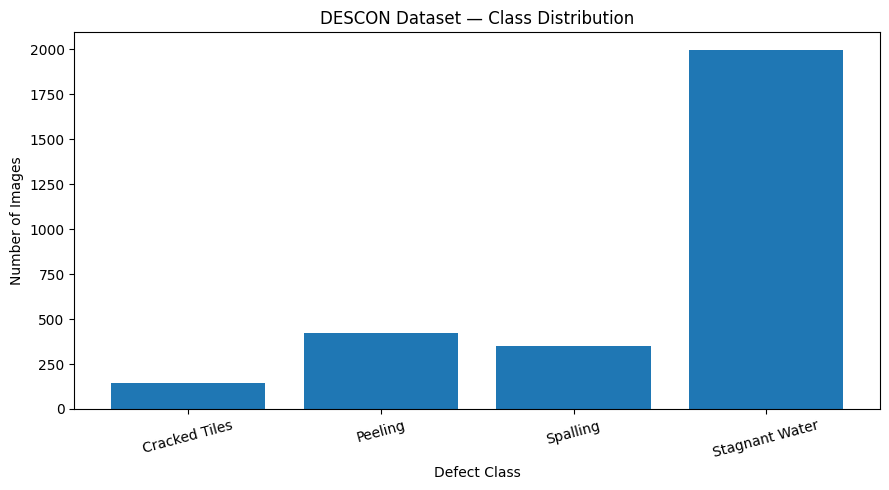


SAMPLE IMAGES


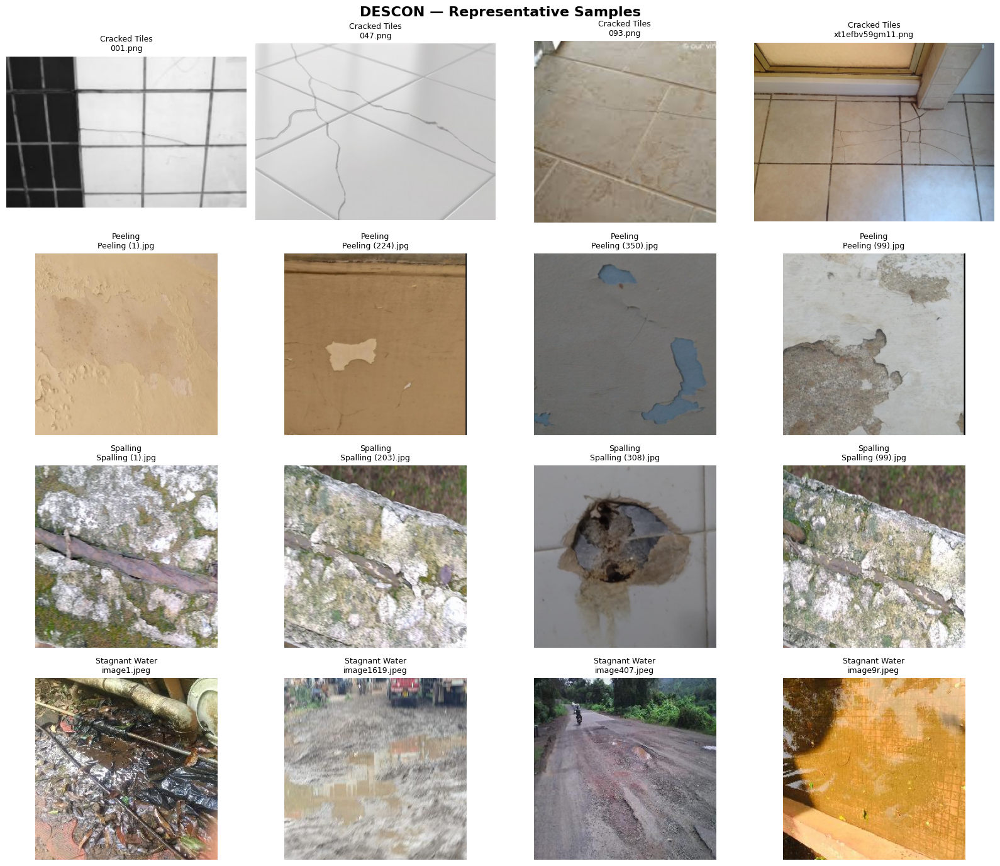


FINAL DATASET SUMMARY
Dataset location : /content/all_files/DESCON
Total images     : 2,908
Readable images  : 2,908
Corrupted images : 0

Class counts:
  Cracked Tiles        :   143
  Peeling              :   420
  Spalling             :   350
  Stagnant Water       : 1,995

✓ Dataset inspection completed.


In [ ]:
# @title
# ============================================================
# DESCON DATASET — COMPLETE INSPECTION & AUDIT
# ============================================================

import os
from PIL import Image
import pandas as pd
import matplotlib.pyplot as plt
from collections import Counter

# ------------------------------------------------------------
# 1. Dataset paths
# ------------------------------------------------------------

DATASET_ROOT = "/content/all_files/DESCON"

CLASS_FOLDERS = {
    "Cracked Tiles": "Cracked_Tiles",
    "Peeling": "Peeling",
    "Spalling": "Spalling",
    "Stagnant Water": "Stagnant Water"
}

VALID_EXTENSIONS = (
    ".jpg", ".jpeg", ".png",
    ".bmp", ".webp", ".tif", ".tiff"
)

# ------------------------------------------------------------
# 2. Basic dataset existence check
# ------------------------------------------------------------

print("=" * 75)
print("DESCON DATASET INSPECTION")
print("=" * 75)

print(f"\nDataset root: {DATASET_ROOT}")

if not os.path.exists(DATASET_ROOT):
    raise FileNotFoundError(f"Dataset directory not found: {DATASET_ROOT}")

print("✓ Dataset root found")


# ------------------------------------------------------------
# 3. Inspect class folders
# ------------------------------------------------------------

print("\n" + "=" * 75)
print("CLASS FOLDER INSPECTION")
print("=" * 75)

class_info = []

for class_name, folder_name in CLASS_FOLDERS.items():

    folder_path = os.path.join(DATASET_ROOT, folder_name)

    if not os.path.exists(folder_path):
        print(f"\n❌ {class_name}")
        print(f"   Missing folder: {folder_path}")
        continue

    files = os.listdir(folder_path)

    image_files = sorted([
        f for f in files
        if f.lower().endswith(VALID_EXTENSIONS)
    ])

    non_image_files = sorted([
        f for f in files
        if not f.lower().endswith(VALID_EXTENSIONS)
    ])

    print(f"\n✓ {class_name}")
    print(f"   Folder : {folder_path}")
    print(f"   Images : {len(image_files)}")

    if non_image_files:
        print(f"   Non-image files : {len(non_image_files)}")

    class_info.append({
        "Class": class_name,
        "Folder": folder_name,
        "Images": len(image_files),
        "Non-Image Files": len(non_image_files)
    })


# ------------------------------------------------------------
# 4. Class distribution
# ------------------------------------------------------------

class_df = pd.DataFrame(class_info)

print("\n" + "=" * 75)
print("CLASS DISTRIBUTION")
print("=" * 75)

display(class_df[["Class", "Images", "Non-Image Files"]])

total_images = class_df["Images"].sum()

print(f"\nTotal images: {total_images:,}")


# ------------------------------------------------------------
# 5. Image readability + dimensions + channels
# ------------------------------------------------------------

print("\n" + "=" * 75)
print("IMAGE QUALITY / FORMAT AUDIT")
print("=" * 75)

image_records = []
corrupted_images = []

for class_name, folder_name in CLASS_FOLDERS.items():

    folder_path = os.path.join(DATASET_ROOT, folder_name)

    if not os.path.exists(folder_path):
        continue

    image_files = sorted([
        f for f in os.listdir(folder_path)
        if f.lower().endswith(VALID_EXTENSIONS)
    ])

    for filename in image_files:

        image_path = os.path.join(folder_path, filename)

        try:
            with Image.open(image_path) as img:

                # Force actual decoding to detect corrupted files
                img.load()

                width, height = img.size
                mode = img.mode

                image_records.append({
                    "Class": class_name,
                    "Filename": filename,
                    "Width": width,
                    "Height": height,
                    "Mode": mode,
                    "Format": img.format,
                    "Channels": len(img.getbands())
                })

        except Exception as e:

            corrupted_images.append({
                "Class": class_name,
                "Filename": filename,
                "Error": str(e)
            })


image_df = pd.DataFrame(image_records)

print(f"\nReadable images : {len(image_df):,}")
print(f"Corrupted images: {len(corrupted_images):,}")


# ------------------------------------------------------------
# 6. Image dimensions summary
# ------------------------------------------------------------

if len(image_df) > 0:

    print("\n" + "-" * 75)
    print("IMAGE DIMENSIONS")
    print("-" * 75)

    dimension_summary = (
        image_df
        .groupby("Class")
        .agg(
            Images=("Filename", "count"),
            Min_Width=("Width", "min"),
            Max_Width=("Width", "max"),
            Min_Height=("Height", "min"),
            Max_Height=("Height", "max"),
            Avg_Width=("Width", "mean"),
            Avg_Height=("Height", "mean")
        )
        .reset_index()
    )

    display(dimension_summary)


# ------------------------------------------------------------
# 7. Most common image dimensions
# ------------------------------------------------------------

if len(image_df) > 0:

    print("\n" + "-" * 75)
    print("MOST COMMON IMAGE DIMENSIONS")
    print("-" * 75)

    image_df["Dimensions"] = (
        image_df["Width"].astype(str)
        + " × "
        + image_df["Height"].astype(str)
    )

    common_dimensions = (
        image_df["Dimensions"]
        .value_counts()
        .head(15)
        .reset_index()
    )

    common_dimensions.columns = ["Dimensions", "Count"]

    display(common_dimensions)


# ------------------------------------------------------------
# 8. Color mode / channel analysis
# ------------------------------------------------------------

if len(image_df) > 0:

    print("\n" + "-" * 75)
    print("IMAGE COLOR MODES")
    print("-" * 75)

    mode_distribution = (
        image_df["Mode"]
        .value_counts()
        .reset_index()
    )

    mode_distribution.columns = ["Mode", "Count"]

    display(mode_distribution)


# ------------------------------------------------------------
# 9. File format distribution
# ------------------------------------------------------------

if len(image_df) > 0:

    print("\n" + "-" * 75)
    print("IMAGE FORMAT DISTRIBUTION")
    print("-" * 75)

    format_distribution = (
        image_df["Format"]
        .value_counts()
        .reset_index()
    )

    format_distribution.columns = ["Format", "Count"]

    display(format_distribution)


# ------------------------------------------------------------
# 10. Corrupted image report
# ------------------------------------------------------------

if corrupted_images:

    print("\n" + "=" * 75)
    print("⚠ CORRUPTED / UNREADABLE IMAGES")
    print("=" * 75)

    corrupted_df = pd.DataFrame(corrupted_images)

    display(corrupted_df)

else:

    print("\n✓ No corrupted or unreadable images detected.")


# ------------------------------------------------------------
# 11. Class distribution plot
# ------------------------------------------------------------

print("\n" + "=" * 75)
print("CLASS DISTRIBUTION PLOT")
print("=" * 75)

plt.figure(figsize=(9, 5))

plt.bar(
    class_df["Class"],
    class_df["Images"]
)

plt.xlabel("Defect Class")
plt.ylabel("Number of Images")
plt.title("DESCON Dataset — Class Distribution")

plt.xticks(rotation=15)
plt.tight_layout()
plt.show()


# ------------------------------------------------------------
# 12. Display representative samples from every class
# ------------------------------------------------------------

print("\n" + "=" * 75)
print("SAMPLE IMAGES")
print("=" * 75)

NUM_SAMPLES = 4

fig, axes = plt.subplots(
    len(CLASS_FOLDERS),
    NUM_SAMPLES,
    figsize=(16, 14)
)

for row_idx, (class_name, folder_name) in enumerate(CLASS_FOLDERS.items()):

    folder_path = os.path.join(DATASET_ROOT, folder_name)

    image_files = sorted([
        f for f in os.listdir(folder_path)
        if f.lower().endswith(VALID_EXTENSIONS)
    ])

    # Take evenly distributed samples instead of only first files
    if len(image_files) >= NUM_SAMPLES:
        sample_indices = [
            int(i * (len(image_files) - 1) / (NUM_SAMPLES - 1))
            for i in range(NUM_SAMPLES)
        ]
        samples = [image_files[i] for i in sample_indices]
    else:
        samples = image_files

    for col_idx in range(NUM_SAMPLES):

        ax = axes[row_idx, col_idx]

        if col_idx < len(samples):

            image_path = os.path.join(
                folder_path,
                samples[col_idx]
            )

            try:
                img = Image.open(image_path)

                ax.imshow(img)
                ax.set_title(
                    f"{class_name}\n{samples[col_idx]}",
                    fontsize=9
                )

            except Exception:
                ax.set_title("Unreadable image")

        ax.axis("off")

plt.suptitle(
    "DESCON — Representative Samples",
    fontsize=16,
    fontweight="bold"
)

plt.tight_layout()
plt.show()


# ------------------------------------------------------------
# 13. Final summary
# ------------------------------------------------------------

print("\n" + "=" * 75)
print("FINAL DATASET SUMMARY")
print("=" * 75)

print(f"Dataset location : {DATASET_ROOT}")
print(f"Total images     : {total_images:,}")
print(f"Readable images  : {len(image_df):,}")
print(f"Corrupted images : {len(corrupted_images):,}")

print("\nClass counts:")

for _, row in class_df.iterrows():
    print(f"  {row['Class']:<20} : {row['Images']:>5,}")

print("\n✓ Dataset inspection completed.")

In [ ]:
# @title
# ============================================================
# INFRAPULSE — CELL 2
# STRATIFIED TRAIN / VALIDATION / TEST SPLIT
# ============================================================

import os
import random
import shutil
from pathlib import Path
from collections import Counter

# ------------------------------------------------------------
# 1. Paths
# ------------------------------------------------------------

SOURCE_DIR = Path("/content/all_files/DESCON")

SPLIT_DIR = Path("/content/all_files/InfraPulse_Split")

TRAIN_DIR = SPLIT_DIR / "train"
VAL_DIR   = SPLIT_DIR / "val"
TEST_DIR  = SPLIT_DIR / "test"

# ------------------------------------------------------------
# 2. Reproducibility
# ------------------------------------------------------------

SEED = 42

random.seed(SEED)

# ------------------------------------------------------------
# 3. Expected classes
# ------------------------------------------------------------

CLASS_NAMES = [
    "Cracked_Tiles",
    "Peeling",
    "Spalling",
    "Stagnant Water"
]

# ------------------------------------------------------------
# 4. Verify source dataset
# ------------------------------------------------------------

if not SOURCE_DIR.exists():
    raise FileNotFoundError(
        f"Source dataset not found at: {SOURCE_DIR}"
    )

print("=" * 70)
print("INFRAPULSE DATASET SPLIT")
print("=" * 70)

print(f"\nSource dataset : {SOURCE_DIR}")
print(f"Output dataset : {SPLIT_DIR}")

# ------------------------------------------------------------
# 5. Collect images
# ------------------------------------------------------------

VALID_EXTENSIONS = {
    ".jpg", ".jpeg", ".png", ".bmp", ".webp"
}

class_images = {}

for class_name in CLASS_NAMES:

    class_dir = SOURCE_DIR / class_name

    if not class_dir.exists():
        raise FileNotFoundError(
            f"Expected class folder not found: {class_dir}"
        )

    images = sorted([
        p for p in class_dir.iterdir()
        if p.is_file() and p.suffix.lower() in VALID_EXTENSIONS
    ])

    if len(images) == 0:
        raise ValueError(
            f"No valid images found in {class_dir}"
        )

    class_images[class_name] = images

# ------------------------------------------------------------
# 6. Display original distribution
# ------------------------------------------------------------

print("\nORIGINAL DATASET DISTRIBUTION")
print("-" * 70)

total_images = 0

for class_name in CLASS_NAMES:

    count = len(class_images[class_name])
    total_images += count

    print(f"{class_name:<20} : {count:>5}")

print("-" * 70)
print(f"{'TOTAL':<20} : {total_images:>5}")

# ------------------------------------------------------------
# 7. Create output directories
# ------------------------------------------------------------

for split_dir in [TRAIN_DIR, VAL_DIR, TEST_DIR]:

    split_dir.mkdir(
        parents=True,
        exist_ok=True
    )

    for class_name in CLASS_NAMES:
        (split_dir / class_name).mkdir(
            parents=True,
            exist_ok=True
        )

# ------------------------------------------------------------
# 8. Stratified split
# ------------------------------------------------------------

TRAIN_RATIO = 0.70
VAL_RATIO   = 0.15
TEST_RATIO  = 0.15

split_records = []

for class_name in CLASS_NAMES:

    images = class_images[class_name].copy()

    # Reproducible shuffle
    rng = random.Random(SEED)
    rng.shuffle(images)

    n = len(images)

    # Number of validation images
    n_val = int(round(n * VAL_RATIO))

    # Number of test images
    n_test = int(round(n * TEST_RATIO))

    # Remaining go to train
    n_train = n - n_val - n_test

    train_images = images[:n_train]
    val_images   = images[n_train:n_train + n_val]
    test_images  = images[n_train + n_val:]

    # --------------------------------------------------------
    # Copy images
    # --------------------------------------------------------

    for img in train_images:
        destination = TRAIN_DIR / class_name / img.name
        shutil.copy2(img, destination)

    for img in val_images:
        destination = VAL_DIR / class_name / img.name
        shutil.copy2(img, destination)

    for img in test_images:
        destination = TEST_DIR / class_name / img.name
        shutil.copy2(img, destination)

    split_records.append({
        "class": class_name,
        "total": n,
        "train": len(train_images),
        "val": len(val_images),
        "test": len(test_images)
    })

# ------------------------------------------------------------
# 9. Print split distribution
# ------------------------------------------------------------

print("\n" + "=" * 70)
print("STRATIFIED SPLIT DISTRIBUTION")
print("=" * 70)

print(
    f"\n{'Class':<20}"
    f"{'Total':>10}"
    f"{'Train':>10}"
    f"{'Val':>10}"
    f"{'Test':>10}"
)

print("-" * 60)

for record in split_records:

    print(
        f"{record['class']:<20}"
        f"{record['total']:>10}"
        f"{record['train']:>10}"
        f"{record['val']:>10}"
        f"{record['test']:>10}"
    )

print("-" * 60)

print(
    f"{'TOTAL':<20}"
    f"{sum(r['total'] for r in split_records):>10}"
    f"{sum(r['train'] for r in split_records):>10}"
    f"{sum(r['val'] for r in split_records):>10}"
    f"{sum(r['test'] for r in split_records):>10}"
)

# ------------------------------------------------------------
# 10. Verify no images are missing
# ------------------------------------------------------------

print("\n" + "=" * 70)
print("SPLIT VERIFICATION")
print("=" * 70)

for class_name in CLASS_NAMES:

    original = set(
        p.name for p in class_images[class_name]
    )

    train_files = set(
        p.name for p in (TRAIN_DIR / class_name).iterdir()
        if p.is_file()
    )

    val_files = set(
        p.name for p in (VAL_DIR / class_name).iterdir()
        if p.is_file()
    )

    test_files = set(
        p.name for p in (TEST_DIR / class_name).iterdir()
        if p.is_file()
    )

    combined = train_files | val_files | test_files

    # Check for missing images
    missing = original - combined

    # Check for duplicate assignment
    train_val_overlap = train_files & val_files
    train_test_overlap = train_files & test_files
    val_test_overlap = val_files & test_files

    print(f"\n{class_name}")

    print(f"  Original images : {len(original)}")
    print(f"  Split images    : {len(combined)}")
    print(f"  Missing         : {len(missing)}")
    print(
        f"  Train/Val overlap  : {len(train_val_overlap)}"
    )
    print(
        f"  Train/Test overlap : {len(train_test_overlap)}"
    )
    print(
        f"  Val/Test overlap   : {len(val_test_overlap)}"
    )

    assert len(missing) == 0, \
        f"Missing images detected in {class_name}"

    assert len(train_val_overlap) == 0, \
        f"Train/Val leakage detected in {class_name}"

    assert len(train_test_overlap) == 0, \
        f"Train/Test leakage detected in {class_name}"

    assert len(val_test_overlap) == 0, \
        f"Val/Test leakage detected in {class_name}"

# ------------------------------------------------------------
# 11. Final confirmation
# ------------------------------------------------------------

print("\n" + "=" * 70)
print("✅ DATASET SPLIT COMPLETE")
print("=" * 70)

print("\nOriginal DESCON dataset was NOT modified.")

print("\nNew structure:")

print("""
InfraPulse_Split/
│
├── train/
│   ├── Cracked_Tiles/
│   ├── Peeling/
│   ├── Spalling/
│   └── Stagnant_Water/
│
├── val/
│   ├── Cracked_Tiles/
│   ├── Peeling/
│   ├── Spalling/
│   └── Stagnant_Water/
│
└── test/
    ├── Cracked_Tiles/
    ├── Peeling/
    ├── Spalling/
    └── Stagnant_Water/
""")

print(f"\nDataset ready at:")
print(SPLIT_DIR)

INFRAPULSE DATASET SPLIT

Source dataset : /content/all_files/DESCON
Output dataset : /content/all_files/InfraPulse_Split

ORIGINAL DATASET DISTRIBUTION
----------------------------------------------------------------------
Cracked_Tiles        :   143
Peeling              :   420
Spalling             :   350
Stagnant Water       :  1995
----------------------------------------------------------------------
TOTAL                :  2908

STRATIFIED SPLIT DISTRIBUTION

Class                    Total     Train       Val      Test
------------------------------------------------------------
Cracked_Tiles              143       101        21        21
Peeling                    420       294        63        63
Spalling                   350       246        52        52
Stagnant Water            1995      1397       299       299
------------------------------------------------------------
TOTAL                     2908      2038       435       435

SPLIT VERIFICATION

Cracked_Tiles
  Ori

CLASS MAPPING
{'Cracked_Tiles': 0, 'Peeling': 1, 'Spalling': 2, 'Stagnant Water': 3}

✅ Class mapping verified.

DATASET SIZES
Training   : 2038
Validation : 435
Test       : 435
Total      : 2908

DEVICE
Using: cuda
GPU: Tesla T4

BATCH INSPECTION
Image tensor shape : torch.Size([32, 3, 224, 224])
Label tensor shape : torch.Size([32])
Image dtype        : torch.float32
Label dtype        : torch.int64

Batch size         : 32
Channels           : 3
Height             : 224
Width              : 224

Labels in batch:
[3, 3, 3, 3, 2, 1, 3, 3, 3, 3, 3, 0, 1, 0, 1, 0, 0, 0, 3, 3, 1, 2, 3, 3, 3, 3, 3, 3, 1, 3, 3, 2]

✅ Tensor validation passed.


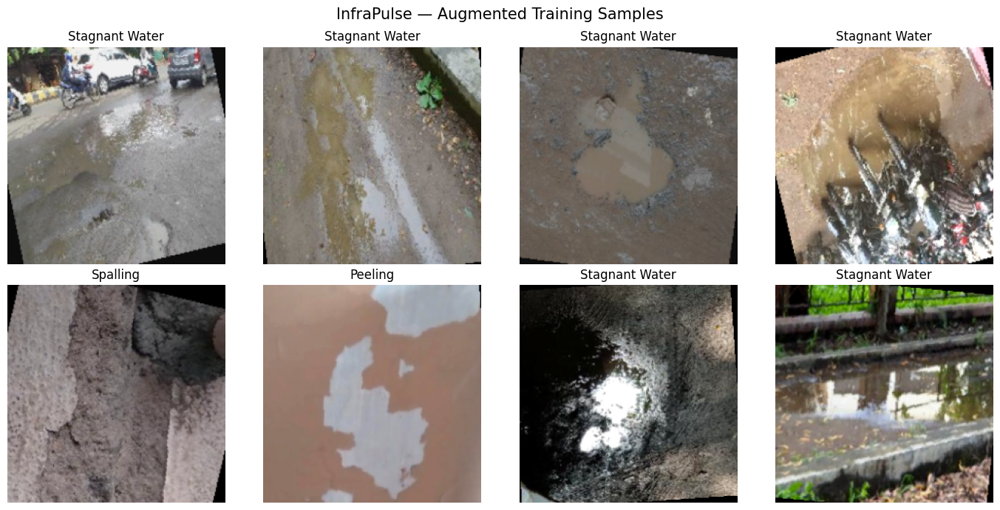


✅ PYTORCH DATA PIPELINE READY

Image size      : 224 × 224
Batch size      : 32

Train samples   : 2038
Val samples     : 435
Test samples    : 435

Classes         : 4

Train loader    : 64 batches
Val loader      : 14 batches
Test loader     : 14 batches

Augmentation    : TRAIN ONLY
Normalization   : ImageNet
Device          : cuda



In [ ]:
# @title
# ============================================================
# INFRAPULSE — CELL 3
# PYTORCH DATASETS + DATALOADERS
# ============================================================

import os
import torch
import numpy as np
import matplotlib.pyplot as plt

from torchvision import datasets, transforms
from torch.utils.data import DataLoader

# ------------------------------------------------------------
# 1. Paths
# ------------------------------------------------------------

SPLIT_DIR = "/content/all_files/InfraPulse_Split"

TRAIN_DIR = os.path.join(SPLIT_DIR, "train")
VAL_DIR   = os.path.join(SPLIT_DIR, "val")
TEST_DIR  = os.path.join(SPLIT_DIR, "test")

# ------------------------------------------------------------
# 2. Reproducibility
# ------------------------------------------------------------

SEED = 42

torch.manual_seed(SEED)
np.random.seed(SEED)

if torch.cuda.is_available():
    torch.cuda.manual_seed_all(SEED)

# ------------------------------------------------------------
# 3. Class configuration
# ------------------------------------------------------------

CLASS_NAMES = [
    "Cracked_Tiles",
    "Peeling",
    "Spalling",
    "Stagnant Water"
]

NUM_CLASSES = len(CLASS_NAMES)

# ------------------------------------------------------------
# 4. Image configuration
# ------------------------------------------------------------

IMAGE_SIZE = 224

# ImageNet normalization
# because our eventual backbone is ImageNet-pretrained

IMAGENET_MEAN = [0.485, 0.456, 0.406]
IMAGENET_STD  = [0.229, 0.224, 0.225]

# ------------------------------------------------------------
# 5. Training transformations
# ------------------------------------------------------------
#
# IMPORTANT:
# Augmentation is applied ONLY to training data.
#
# These transformations are intentionally moderate.
# We don't want to destroy defect patterns such as:
# - cracks
# - peeling boundaries
# - spalling regions
# - water surfaces
# ------------------------------------------------------------

train_transform = transforms.Compose([

    transforms.Resize(
        (IMAGE_SIZE, IMAGE_SIZE)
    ),

    transforms.RandomHorizontalFlip(
        p=0.5
    ),

    transforms.RandomVerticalFlip(
        p=0.15
    ),

    transforms.RandomRotation(
        degrees=15
    ),

    transforms.ColorJitter(
        brightness=0.20,
        contrast=0.20,
        saturation=0.15,
        hue=0.03
    ),

    transforms.RandomResizedCrop(
        size=IMAGE_SIZE,
        scale=(0.80, 1.0),
        ratio=(0.90, 1.10)
    ),

    transforms.ToTensor(),

    transforms.Normalize(
        mean=IMAGENET_MEAN,
        std=IMAGENET_STD
    )
])

# ------------------------------------------------------------
# 6. Validation transformations
# ------------------------------------------------------------
#
# NO random augmentation.
#
# Validation must represent real inference conditions.
# ------------------------------------------------------------

val_transform = transforms.Compose([

    transforms.Resize(
        (IMAGE_SIZE, IMAGE_SIZE)
    ),

    transforms.ToTensor(),

    transforms.Normalize(
        mean=IMAGENET_MEAN,
        std=IMAGENET_STD
    )
])

# ------------------------------------------------------------
# 7. Test transformations
# ------------------------------------------------------------

test_transform = transforms.Compose([

    transforms.Resize(
        (IMAGE_SIZE, IMAGE_SIZE)
    ),

    transforms.ToTensor(),

    transforms.Normalize(
        mean=IMAGENET_MEAN,
        std=IMAGENET_STD
    )
])

# ------------------------------------------------------------
# 8. Create datasets
# ------------------------------------------------------------

train_dataset = datasets.ImageFolder(
    root=TRAIN_DIR,
    transform=train_transform
)

val_dataset = datasets.ImageFolder(
    root=VAL_DIR,
    transform=val_transform
)

test_dataset = datasets.ImageFolder(
    root=TEST_DIR,
    transform=test_transform
)

# ------------------------------------------------------------
# 9. Verify class mapping
# ------------------------------------------------------------

print("=" * 70)
print("CLASS MAPPING")
print("=" * 70)

print(train_dataset.class_to_idx)

# Make sure ImageFolder discovered exactly our expected classes
expected_mapping = {
    "Cracked_Tiles": 0,
    "Peeling": 1,
    "Spalling": 2,
    "Stagnant Water": 3
}

assert train_dataset.class_to_idx == expected_mapping, \
    f"Unexpected class mapping: {train_dataset.class_to_idx}"

assert val_dataset.class_to_idx == expected_mapping
assert test_dataset.class_to_idx == expected_mapping

print("\n✅ Class mapping verified.")

# ------------------------------------------------------------
# 10. Dataset sizes
# ------------------------------------------------------------

print("\n" + "=" * 70)
print("DATASET SIZES")
print("=" * 70)

print(f"Training   : {len(train_dataset)}")
print(f"Validation : {len(val_dataset)}")
print(f"Test       : {len(test_dataset)}")
print(f"Total      : {len(train_dataset) + len(val_dataset) + len(test_dataset)}")

# ------------------------------------------------------------
# 11. DataLoader configuration
# ------------------------------------------------------------

BATCH_SIZE = 32

# Use GPU if available
DEVICE = torch.device(
    "cuda" if torch.cuda.is_available() else "cpu"
)

print("\n" + "=" * 70)
print("DEVICE")
print("=" * 70)

print(f"Using: {DEVICE}")

if DEVICE.type == "cuda":
    print(f"GPU: {torch.cuda.get_device_name(0)}")

# Number of workers
# Colab generally works well with 2–4.
NUM_WORKERS = 2

train_loader = DataLoader(
    train_dataset,
    batch_size=BATCH_SIZE,
    shuffle=True,
    num_workers=NUM_WORKERS,
    pin_memory=(DEVICE.type == "cuda")
)

val_loader = DataLoader(
    val_dataset,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=NUM_WORKERS,
    pin_memory=(DEVICE.type == "cuda")
)

test_loader = DataLoader(
    test_dataset,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=NUM_WORKERS,
    pin_memory=(DEVICE.type == "cuda")
)

# ------------------------------------------------------------
# 12. Inspect one batch
# ------------------------------------------------------------

images, labels = next(iter(train_loader))

print("\n" + "=" * 70)
print("BATCH INSPECTION")
print("=" * 70)

print(f"Image tensor shape : {images.shape}")
print(f"Label tensor shape : {labels.shape}")
print(f"Image dtype        : {images.dtype}")
print(f"Label dtype        : {labels.dtype}")

print(f"\nBatch size         : {images.shape[0]}")
print(f"Channels           : {images.shape[1]}")
print(f"Height             : {images.shape[2]}")
print(f"Width              : {images.shape[3]}")

print(f"\nLabels in batch:")
print(labels.tolist())

# ------------------------------------------------------------
# 13. Verify tensor validity
# ------------------------------------------------------------

assert images.shape[1:] == (3, IMAGE_SIZE, IMAGE_SIZE), \
    "Unexpected image tensor dimensions."

assert not torch.isnan(images).any(), \
    "NaN values detected in image tensor."

assert not torch.isinf(images).any(), \
    "Infinite values detected in image tensor."

print("\n✅ Tensor validation passed.")

# ------------------------------------------------------------
# 14. Display augmented training samples
# ------------------------------------------------------------
#
# We need to reverse ImageNet normalization for visualization.
# ------------------------------------------------------------

def denormalize(image):

    mean = torch.tensor(
        IMAGENET_MEAN
    ).view(3, 1, 1)

    std = torch.tensor(
        IMAGENET_STD
    ).view(3, 1, 1)

    image = image.cpu() * std + mean

    return torch.clamp(image, 0, 1)


# Display first 8 images

num_display = min(8, len(images))

fig, axes = plt.subplots(
    2,
    4,
    figsize=(14, 7)
)

axes = axes.flatten()

for i in range(num_display):

    img = denormalize(images[i])

    axes[i].imshow(
        img.permute(1, 2, 0).numpy()
    )

    axes[i].set_title(
        CLASS_NAMES[labels[i].item()]
    )

    axes[i].axis("off")

for i in range(num_display, len(axes)):
    axes[i].axis("off")

plt.suptitle(
    "InfraPulse — Augmented Training Samples",
    fontsize=15
)

plt.tight_layout()
plt.show()

# ------------------------------------------------------------
# 15. Final summary
# ------------------------------------------------------------

print("\n" + "=" * 70)
print("✅ PYTORCH DATA PIPELINE READY")
print("=" * 70)

print(f"""
Image size      : {IMAGE_SIZE} × {IMAGE_SIZE}
Batch size      : {BATCH_SIZE}

Train samples   : {len(train_dataset)}
Val samples     : {len(val_dataset)}
Test samples    : {len(test_dataset)}

Classes         : {NUM_CLASSES}

Train loader    : {len(train_loader)} batches
Val loader      : {len(val_loader)} batches
Test loader     : {len(test_loader)} batches

Augmentation    : TRAIN ONLY
Normalization   : ImageNet
Device          : {DEVICE}
""")

In [ ]:
# @title
# ============================================================
# INFRAPULSE — CELL 4
# CLASS BALANCING + WEIGHTED RANDOM SAMPLER
# ============================================================

import torch
import numpy as np

from torch.utils.data import DataLoader, WeightedRandomSampler

# ------------------------------------------------------------
# 1. Get labels from the training dataset
# ------------------------------------------------------------

# ImageFolder stores:
# train_dataset.samples = [(image_path, class_index), ...]

train_labels = np.array([
    label for _, label in train_dataset.samples
])

# ------------------------------------------------------------
# 2. Count samples in each class
# ------------------------------------------------------------

class_counts = np.bincount(
    train_labels,
    minlength=NUM_CLASSES
)

print("=" * 70)
print("TRAINING CLASS DISTRIBUTION")
print("=" * 70)

for idx, class_name in enumerate(CLASS_NAMES):

    print(
        f"{idx} | "
        f"{class_name:<20} | "
        f"{class_counts[idx]:>5} images"
    )

print("-" * 70)
print(f"Total training images: {len(train_labels)}")

# ------------------------------------------------------------
# 3. Calculate class weights
# ------------------------------------------------------------
#
# Inverse-frequency weighting:
#
#       weight_i = N / (C * count_i)
#
# where:
# N = total number of training samples
# C = number of classes
# count_i = samples belonging to class i
#
# This gives minority classes larger weights.
# ------------------------------------------------------------

N = len(train_labels)
C = NUM_CLASSES

class_weights = N / (
    C * class_counts
)

print("\n" + "=" * 70)
print("CLASS WEIGHTS")
print("=" * 70)

for idx, class_name in enumerate(CLASS_NAMES):

    print(
        f"{class_name:<20} : "
        f"{class_weights[idx]:.4f}"
    )

# ------------------------------------------------------------
# 4. Create a weight for EVERY training image
# ------------------------------------------------------------
#
# Example:
#
# If image belongs to Cracked_Tiles:
# image_weight = weight_of_Cracked_Tiles
#
# If image belongs to Stagnant_Water:
# image_weight = weight_of_Stagnant_Water
# ------------------------------------------------------------

sample_weights = class_weights[train_labels]

sample_weights = torch.tensor(
    sample_weights,
    dtype=torch.double
)

# ------------------------------------------------------------
# 5. Create WeightedRandomSampler
# ------------------------------------------------------------
#
# replacement=True means an image can appear more than once
# across an epoch.
#
# This is expected and useful for minority classes.
#
# IMPORTANT:
# We sample exactly N images per epoch, so the effective
# epoch size remains approximately the same as before.
# ------------------------------------------------------------

sampler = WeightedRandomSampler(
    weights=sample_weights,
    num_samples=len(sample_weights),
    replacement=True
)

# ------------------------------------------------------------
# 6. Rebuild TRAIN DataLoader
# ------------------------------------------------------------
#
# IMPORTANT:
# When sampler is used, shuffle MUST be False.
# ------------------------------------------------------------

train_loader = DataLoader(
    train_dataset,
    batch_size=BATCH_SIZE,
    sampler=sampler,
    shuffle=False,
    num_workers=NUM_WORKERS,
    pin_memory=(DEVICE.type == "cuda")
)

# ------------------------------------------------------------
# 7. Keep validation/test loaders unchanged
# ------------------------------------------------------------

val_loader = DataLoader(
    val_dataset,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=NUM_WORKERS,
    pin_memory=(DEVICE.type == "cuda")
)

test_loader = DataLoader(
    test_dataset,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=NUM_WORKERS,
    pin_memory=(DEVICE.type == "cuda")
)

# ------------------------------------------------------------
# 8. Simulate one complete sampled epoch
# ------------------------------------------------------------
#
# This verifies that the sampler is actually balancing the
# classes rather than simply assuming it works.
# ------------------------------------------------------------

sampled_indices = list(
    sampler
)

sampled_labels = train_labels[
    sampled_indices
]

sampled_counts = np.bincount(
    sampled_labels,
    minlength=NUM_CLASSES
)

print("\n" + "=" * 70)
print("ONE SAMPLED TRAINING EPOCH")
print("=" * 70)

print(
    f"\n{'Class':<20}"
    f"{'Original':>12}"
    f"{'Sampled':>12}"
)

print("-" * 46)

for idx, class_name in enumerate(CLASS_NAMES):

    print(
        f"{class_name:<20}"
        f"{class_counts[idx]:>12}"
        f"{sampled_counts[idx]:>12}"
    )

# ------------------------------------------------------------
# 9. Calculate sampled percentages
# ------------------------------------------------------------

print("\n" + "=" * 70)
print("SAMPLED CLASS PERCENTAGES")
print("=" * 70)

for idx, class_name in enumerate(CLASS_NAMES):

    percentage = (
        sampled_counts[idx]
        / len(sampled_labels)
        * 100
    )

    print(
        f"{class_name:<20} : "
        f"{percentage:6.2f}%"
    )

# ------------------------------------------------------------
# 10. Inspect several actual batches
# ------------------------------------------------------------

print("\n" + "=" * 70)
print("BATCH BALANCE CHECK")
print("=" * 70)

train_iterator = iter(train_loader)

for batch_number in range(5):

    _, batch_labels = next(train_iterator)

    batch_counts = torch.bincount(
        batch_labels,
        minlength=NUM_CLASSES
    )

    print(
        f"\nBatch {batch_number + 1}:"
    )

    for idx, class_name in enumerate(CLASS_NAMES):

        print(
            f"  {class_name:<18} "
            f"{batch_counts[idx].item():>2}"
        )

# ------------------------------------------------------------
# 11. Final verification
# ------------------------------------------------------------

assert len(sample_weights) == len(train_dataset)

assert len(train_loader.dataset) == len(train_dataset)

assert len(val_loader.dataset) == len(val_dataset)

assert len(test_loader.dataset) == len(test_dataset)

print("\n" + "=" * 70)
print("✅ CLASS BALANCING COMPLETE")
print("=" * 70)

print(f"""
Original training distribution:
{dict(zip(CLASS_NAMES, class_counts))}

Sampler:
WeightedRandomSampler

Samples per epoch:
{len(sample_weights)}

Training batches per epoch:
{len(train_loader)}

Validation:
UNCHANGED

Test:
UNCHANGED
""")

TRAINING CLASS DISTRIBUTION
0 | Cracked_Tiles        |   101 images
1 | Peeling              |   294 images
2 | Spalling             |   246 images
3 | Stagnant Water       |  1397 images
----------------------------------------------------------------------
Total training images: 2038

CLASS WEIGHTS
Cracked_Tiles        : 5.0446
Peeling              : 1.7330
Spalling             : 2.0711
Stagnant Water       : 0.3647

ONE SAMPLED TRAINING EPOCH

Class                   Original     Sampled
----------------------------------------------
Cracked_Tiles                101         508
Peeling                      294         515
Spalling                     246         505
Stagnant Water              1397         510

SAMPLED CLASS PERCENTAGES
Cracked_Tiles        :  24.93%
Peeling              :  25.27%
Spalling             :  24.78%
Stagnant Water       :  25.02%

BATCH BALANCE CHECK

Batch 1:
  Cracked_Tiles       5
  Peeling             9
  Spalling           14
  Stagnant Water      4

In [ ]:
# @title
# ============================================================
# INFRAPULSE — CELL 5
# RESNET18 MODEL
# ============================================================

import torch
import torch.nn as nn
from torchvision import models

# ------------------------------------------------------------
# 1. Device
# ------------------------------------------------------------

DEVICE = torch.device(
    "cuda" if torch.cuda.is_available() else "cpu"
)

print("Device:", DEVICE)

# ------------------------------------------------------------
# 2. Load ImageNet-pretrained ResNet18
# ------------------------------------------------------------

weights = models.ResNet18_Weights.DEFAULT

model = models.resnet18(
    weights=weights
)

# ------------------------------------------------------------
# 3. Replace classification head
# ------------------------------------------------------------

num_features = model.fc.in_features

model.fc = nn.Sequential(
    nn.Dropout(p=0.30),
    nn.Linear(
        num_features,
        NUM_CLASSES
    )
)

# ------------------------------------------------------------
# 4. Move model to device
# ------------------------------------------------------------

model = model.to(DEVICE)

# ------------------------------------------------------------
# 5. Loss function
# ------------------------------------------------------------

criterion = nn.CrossEntropyLoss()

# ------------------------------------------------------------
# 6. Optimizer
# ------------------------------------------------------------

optimizer = torch.optim.AdamW(
    model.parameters(),
    lr=1e-4,
    weight_decay=1e-4
)

# ------------------------------------------------------------
# 7. Learning-rate scheduler
# ------------------------------------------------------------

scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
    optimizer,
    mode="min",
    factor=0.5,
    patience=2
)

# ------------------------------------------------------------
# 8. Model summary
# ------------------------------------------------------------

print("\n" + "=" * 70)
print("MODEL")
print("=" * 70)

print(model)

print("\n" + "=" * 70)
print("TRAINING CONFIGURATION")
print("=" * 70)

print(f"Classes       : {NUM_CLASSES}")
print(f"Parameters    : {sum(p.numel() for p in model.parameters()):,}")
print(f"Trainable     : {sum(p.numel() for p in model.parameters() if p.requires_grad):,}")
print(f"Learning rate : {optimizer.param_groups[0]['lr']}")
print(f"Weight decay  : {1e-4}")
print(f"Dropout       : 0.30")
print(f"Loss          : CrossEntropyLoss")
print(f"Optimizer     : AdamW")

Device: cuda
Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth


100%|██████████| 44.7M/44.7M [00:00<00:00, 119MB/s]



MODEL
ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=T

In [ ]:
# @title
# ============================================================
# INFRAPULSE — CELL 6
# TRAINING + VALIDATION
# ============================================================

import time
import numpy as np
import torch

from sklearn.metrics import (
    accuracy_score,
    precision_score,
    recall_score,
    f1_score
)

# ------------------------------------------------------------
# 1. Training configuration
# ------------------------------------------------------------

NUM_EPOCHS = 20

best_val_f1 = -1.0
best_epoch = 0

MODEL_DIR = "/content/all_files/models"

import os
os.makedirs(MODEL_DIR, exist_ok=True)

BEST_MODEL_PATH = os.path.join(
    MODEL_DIR,
    "infrapulse_resnet18_best.pth"
)

# ------------------------------------------------------------
# 2. History
# ------------------------------------------------------------

history = {
    "train_loss": [],
    "val_loss": [],
    "train_acc": [],
    "val_acc": [],
    "train_f1": [],
    "val_f1": []
}

# ------------------------------------------------------------
# 3. Training loop
# ------------------------------------------------------------

for epoch in range(NUM_EPOCHS):

    epoch_start = time.time()

    # ========================================================
    # TRAIN
    # ========================================================

    model.train()

    running_train_loss = 0.0

    train_preds = []
    train_targets = []

    for images, labels in train_loader:

        images = images.to(
            DEVICE,
            non_blocking=True
        )

        labels = labels.to(
            DEVICE,
            non_blocking=True
        )

        # Clear gradients
        optimizer.zero_grad(
            set_to_none=True
        )

        # Forward pass
        outputs = model(images)

        loss = criterion(
            outputs,
            labels
        )

        # Backpropagation
        loss.backward()

        # Update weights
        optimizer.step()

        # Statistics
        running_train_loss += (
            loss.item() * images.size(0)
        )

        predictions = torch.argmax(
            outputs,
            dim=1
        )

        train_preds.extend(
            predictions.detach().cpu().numpy()
        )

        train_targets.extend(
            labels.detach().cpu().numpy()
        )

    # --------------------------------------------------------
    # Train metrics
    # --------------------------------------------------------

    train_loss = (
        running_train_loss
        / len(train_dataset)
    )

    train_acc = accuracy_score(
        train_targets,
        train_preds
    )

    train_f1 = f1_score(
        train_targets,
        train_preds,
        average="macro",
        zero_division=0
    )

    # ========================================================
    # VALIDATION
    # ========================================================

    model.eval()

    running_val_loss = 0.0

    val_preds = []
    val_targets = []

    with torch.no_grad():

        for images, labels in val_loader:

            images = images.to(
                DEVICE,
                non_blocking=True
            )

            labels = labels.to(
                DEVICE,
                non_blocking=True
            )

            outputs = model(images)

            loss = criterion(
                outputs,
                labels
            )

            running_val_loss += (
                loss.item() * images.size(0)
            )

            predictions = torch.argmax(
                outputs,
                dim=1
            )

            val_preds.extend(
                predictions.cpu().numpy()
            )

            val_targets.extend(
                labels.cpu().numpy()
            )

    # --------------------------------------------------------
    # Validation metrics
    # --------------------------------------------------------

    val_loss = (
        running_val_loss
        / len(val_dataset)
    )

    val_acc = accuracy_score(
        val_targets,
        val_preds
    )

    val_f1 = f1_score(
        val_targets,
        val_preds,
        average="macro",
        zero_division=0
    )

    # --------------------------------------------------------
    # Scheduler
    # --------------------------------------------------------

    scheduler.step(val_loss)

    # --------------------------------------------------------
    # Save history
    # --------------------------------------------------------

    history["train_loss"].append(train_loss)
    history["val_loss"].append(val_loss)

    history["train_acc"].append(train_acc)
    history["val_acc"].append(val_acc)

    history["train_f1"].append(train_f1)
    history["val_f1"].append(val_f1)

    # --------------------------------------------------------
    # Save best model
    # --------------------------------------------------------

    if val_f1 > best_val_f1:

        best_val_f1 = val_f1
        best_epoch = epoch + 1

        torch.save(
            {
                "epoch": epoch + 1,
                "model_state_dict": model.state_dict(),
                "optimizer_state_dict": optimizer.state_dict(),
                "val_f1": val_f1,
                "class_names": CLASS_NAMES
            },
            BEST_MODEL_PATH
        )

        best_marker = " ★ BEST"

    else:
        best_marker = ""

    # --------------------------------------------------------
    # Epoch output
    # --------------------------------------------------------

    epoch_time = time.time() - epoch_start

    current_lr = optimizer.param_groups[0]["lr"]

    print(
        f"Epoch [{epoch+1:02d}/{NUM_EPOCHS}] "
        f"| Train Loss: {train_loss:.4f} "
        f"| Val Loss: {val_loss:.4f} "
        f"| Train F1: {train_f1:.4f} "
        f"| Val F1: {val_f1:.4f} "
        f"| Val Acc: {val_acc:.4f} "
        f"| LR: {current_lr:.2e} "
        f"| {epoch_time:.1f}s"
        f"{best_marker}"
    )

# ------------------------------------------------------------
# Final training information
# ------------------------------------------------------------

print("\n" + "=" * 70)
print("✅ TRAINING COMPLETE")
print("=" * 70)

print(f"Best epoch       : {best_epoch}")
print(f"Best Val Macro-F1: {best_val_f1:.4f}")
print(f"Best model       : {BEST_MODEL_PATH}")

Epoch [01/20] | Train Loss: 0.3213 | Val Loss: 0.1218 | Train F1: 0.8853 | Val F1: 0.9210 | Val Acc: 0.9586 | LR: 1.00e-04 | 32.0s ★ BEST
Epoch [02/20] | Train Loss: 0.0974 | Val Loss: 0.0990 | Train F1: 0.9695 | Val F1: 0.9326 | Val Acc: 0.9678 | LR: 1.00e-04 | 28.2s ★ BEST
Epoch [03/20] | Train Loss: 0.0971 | Val Loss: 0.1031 | Train F1: 0.9641 | Val F1: 0.9481 | Val Acc: 0.9724 | LR: 1.00e-04 | 27.9s ★ BEST
Epoch [04/20] | Train Loss: 0.0465 | Val Loss: 0.1104 | Train F1: 0.9865 | Val F1: 0.9354 | Val Acc: 0.9678 | LR: 1.00e-04 | 28.0s
Epoch [05/20] | Train Loss: 0.0497 | Val Loss: 0.1011 | Train F1: 0.9827 | Val F1: 0.9482 | Val Acc: 0.9724 | LR: 5.00e-05 | 28.6s ★ BEST
Epoch [06/20] | Train Loss: 0.0279 | Val Loss: 0.0918 | Train F1: 0.9923 | Val F1: 0.9582 | Val Acc: 0.9793 | LR: 5.00e-05 | 31.0s ★ BEST
Epoch [07/20] | Train Loss: 0.0419 | Val Loss: 0.0968 | Train F1: 0.9898 | Val F1: 0.9528 | Val Acc: 0.9747 | LR: 5.00e-05 | 30.1s
Epoch [08/20] | Train Loss: 0.0227 | Val Loss: 0

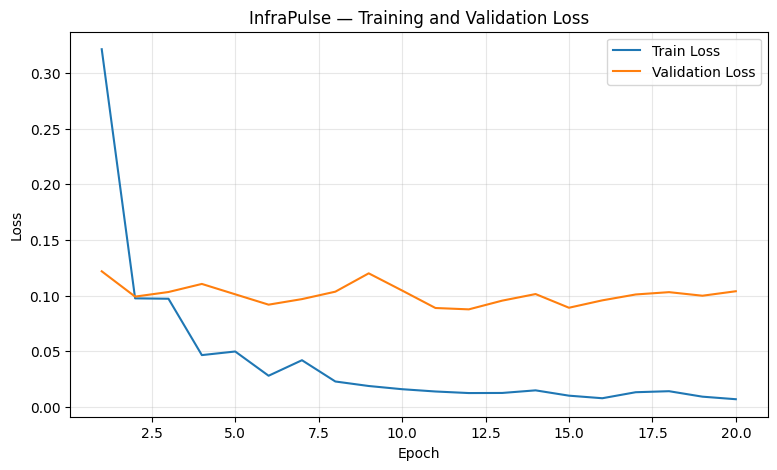

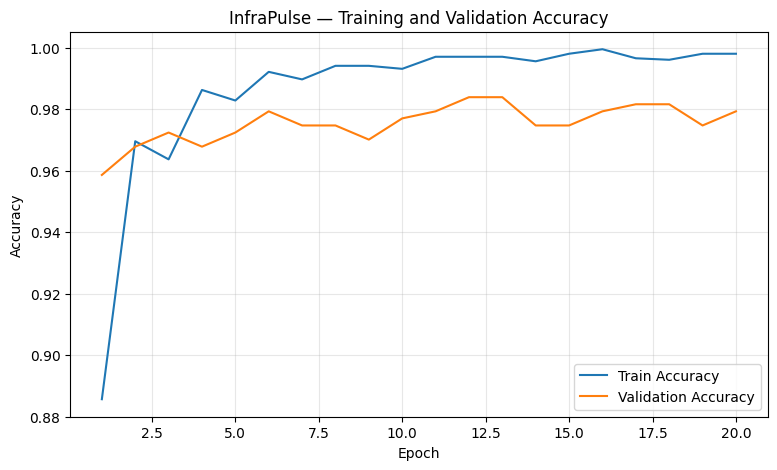

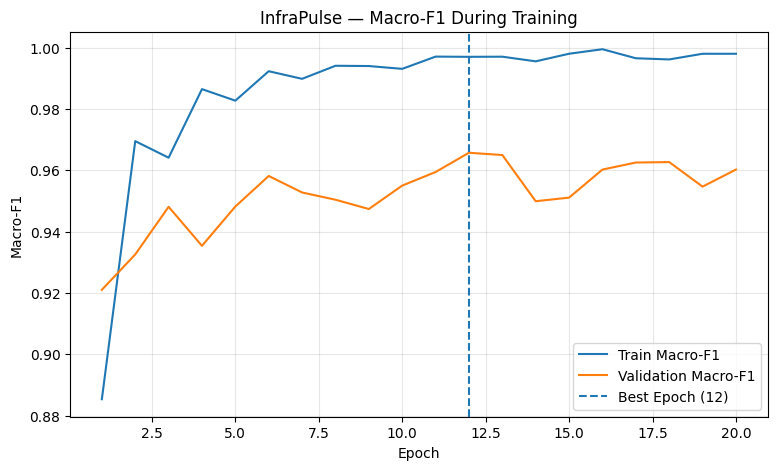

In [ ]:
# @title
# ============================================================
# INFRAPULSE — CELL 7
# TRAINING CURVES
# ============================================================

import matplotlib.pyplot as plt

epochs = range(
    1,
    NUM_EPOCHS + 1
)

# ------------------------------------------------------------
# Loss curve
# ------------------------------------------------------------

plt.figure(figsize=(9, 5))

plt.plot(
    epochs,
    history["train_loss"],
    label="Train Loss"
)

plt.plot(
    epochs,
    history["val_loss"],
    label="Validation Loss"
)

plt.xlabel("Epoch")
plt.ylabel("Loss")

plt.title(
    "InfraPulse — Training and Validation Loss"
)

plt.legend()
plt.grid(alpha=0.3)

plt.show()

# ------------------------------------------------------------
# Accuracy curve
# ------------------------------------------------------------

plt.figure(figsize=(9, 5))

plt.plot(
    epochs,
    history["train_acc"],
    label="Train Accuracy"
)

plt.plot(
    epochs,
    history["val_acc"],
    label="Validation Accuracy"
)

plt.xlabel("Epoch")
plt.ylabel("Accuracy")

plt.title(
    "InfraPulse — Training and Validation Accuracy"
)

plt.legend()
plt.grid(alpha=0.3)

plt.show()

# ------------------------------------------------------------
# Macro-F1 curve
# ------------------------------------------------------------

plt.figure(figsize=(9, 5))

plt.plot(
    epochs,
    history["train_f1"],
    label="Train Macro-F1"
)

plt.plot(
    epochs,
    history["val_f1"],
    label="Validation Macro-F1"
)

plt.axvline(
    best_epoch,
    linestyle="--",
    label=f"Best Epoch ({best_epoch})"
)

plt.xlabel("Epoch")
plt.ylabel("Macro-F1")

plt.title(
    "InfraPulse — Macro-F1 During Training"
)

plt.legend()
plt.grid(alpha=0.3)

plt.show()

In [ ]:
# @title
# ============================================================
# INFRAPULSE — CELL 8
# BEST MODEL + TEST EVALUATION
# ============================================================

import torch
import numpy as np

from sklearn.metrics import (
    accuracy_score,
    precision_score,
    recall_score,
    f1_score,
    classification_report
)

# ------------------------------------------------------------
# 1. Load best checkpoint
# ------------------------------------------------------------

checkpoint = torch.load(
    BEST_MODEL_PATH,
    map_location=DEVICE
)

model.load_state_dict(
    checkpoint["model_state_dict"]
)

model.eval()

print("=" * 70)
print("BEST MODEL LOADED")
print("=" * 70)

print(f"Epoch       : {checkpoint['epoch']}")
print(f"Val Macro-F1: {checkpoint['val_f1']:.4f}")

# ------------------------------------------------------------
# 2. Test inference
# ------------------------------------------------------------

test_preds = []
test_targets = []

test_probabilities = []

with torch.no_grad():

    for images, labels in test_loader:

        images = images.to(
            DEVICE,
            non_blocking=True
        )

        outputs = model(images)

        probabilities = torch.softmax(
            outputs,
            dim=1
        )

        predictions = torch.argmax(
            probabilities,
            dim=1
        )

        test_preds.extend(
            predictions.cpu().numpy()
        )

        test_targets.extend(
            labels.numpy()
        )

        test_probabilities.extend(
            probabilities.cpu().numpy()
        )

test_preds = np.array(test_preds)
test_targets = np.array(test_targets)
test_probabilities = np.array(
    test_probabilities
)

# ------------------------------------------------------------
# 3. Calculate metrics
# ------------------------------------------------------------

test_accuracy = accuracy_score(
    test_targets,
    test_preds
)

test_precision_macro = precision_score(
    test_targets,
    test_preds,
    average="macro",
    zero_division=0
)

test_recall_macro = recall_score(
    test_targets,
    test_preds,
    average="macro",
    zero_division=0
)

test_f1_macro = f1_score(
    test_targets,
    test_preds,
    average="macro",
    zero_division=0
)

test_f1_weighted = f1_score(
    test_targets,
    test_preds,
    average="weighted",
    zero_division=0
)

# ------------------------------------------------------------
# 4. Overall results
# ------------------------------------------------------------

print("\n" + "=" * 70)
print("TEST SET RESULTS")
print("=" * 70)

print(f"\nAccuracy          : {test_accuracy:.4f}")
print(f"Macro Precision   : {test_precision_macro:.4f}")
print(f"Macro Recall      : {test_recall_macro:.4f}")
print(f"Macro F1          : {test_f1_macro:.4f}")
print(f"Weighted F1       : {test_f1_weighted:.4f}")

# ------------------------------------------------------------
# 5. Classification report
# ------------------------------------------------------------

print("\n" + "=" * 70)
print("PER-CLASS PERFORMANCE")
print("=" * 70)

print(
    classification_report(
        test_targets,
        test_preds,
        target_names=CLASS_NAMES,
        digits=4,
        zero_division=0
    )
)

BEST MODEL LOADED
Epoch       : 12
Val Macro-F1: 0.9657

TEST SET RESULTS

Accuracy          : 0.9816
Macro Precision   : 0.9579
Macro Recall      : 0.9641
Macro F1          : 0.9608
Weighted F1       : 0.9816

PER-CLASS PERFORMANCE
                precision    recall  f1-score   support

 Cracked_Tiles     0.9091    0.9524    0.9302        21
       Peeling     0.9683    0.9683    0.9683        63
      Spalling     0.9608    0.9423    0.9515        52
Stagnant Water     0.9933    0.9933    0.9933       299

      accuracy                         0.9816       435
     macro avg     0.9579    0.9641    0.9608       435
  weighted avg     0.9817    0.9816    0.9816       435



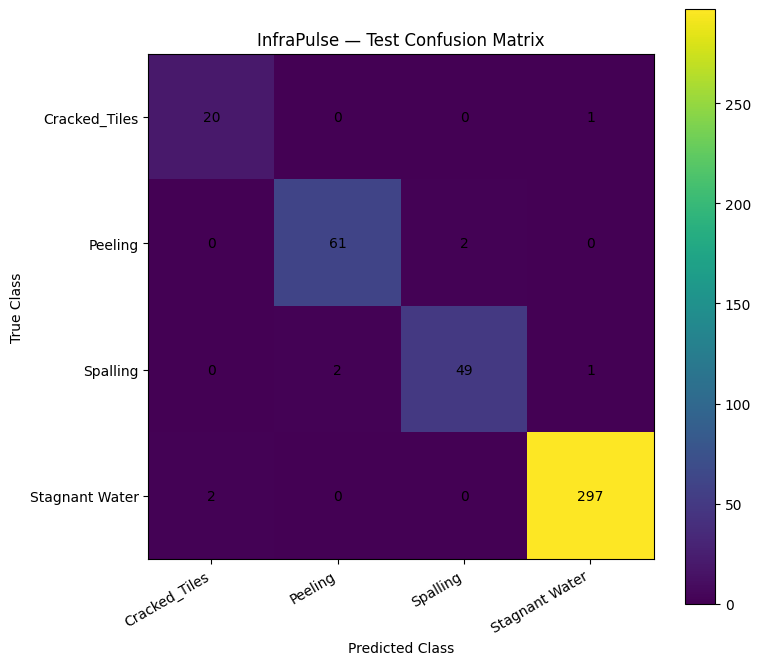


PER-CLASS RECALL
Cracked_Tiles        : 0.9524
Peeling              : 0.9683
Spalling             : 0.9423
Stagnant Water       : 0.9933


In [ ]:
# @title
# ============================================================
# INFRAPULSE — CELL 9
# CONFUSION MATRIX
# ============================================================

import matplotlib.pyplot as plt

from sklearn.metrics import confusion_matrix

# ------------------------------------------------------------
# 1. Calculate confusion matrix
# ------------------------------------------------------------

cm = confusion_matrix(
    test_targets,
    test_preds
)

# ------------------------------------------------------------
# 2. Plot
# ------------------------------------------------------------

plt.figure(figsize=(8, 7))

plt.imshow(cm)

plt.title(
    "InfraPulse — Test Confusion Matrix"
)

plt.xlabel("Predicted Class")
plt.ylabel("True Class")

plt.xticks(
    range(NUM_CLASSES),
    CLASS_NAMES,
    rotation=30,
    ha="right"
)

plt.yticks(
    range(NUM_CLASSES),
    CLASS_NAMES
)

# ------------------------------------------------------------
# 3. Add values
# ------------------------------------------------------------

for i in range(NUM_CLASSES):

    for j in range(NUM_CLASSES):

        plt.text(
            j,
            i,
            str(cm[i, j]),
            ha="center",
            va="center"
        )

plt.colorbar()

plt.tight_layout()
plt.show()

# ------------------------------------------------------------
# 4. Per-class recall
# ------------------------------------------------------------

print("\n" + "=" * 70)
print("PER-CLASS RECALL")
print("=" * 70)

for i, class_name in enumerate(CLASS_NAMES):

    true_count = cm[i].sum()

    correct = cm[i, i]

    recall = (
        correct / true_count
        if true_count > 0
        else 0
    )

    print(
        f"{class_name:<20} : "
        f"{recall:.4f}"
    )

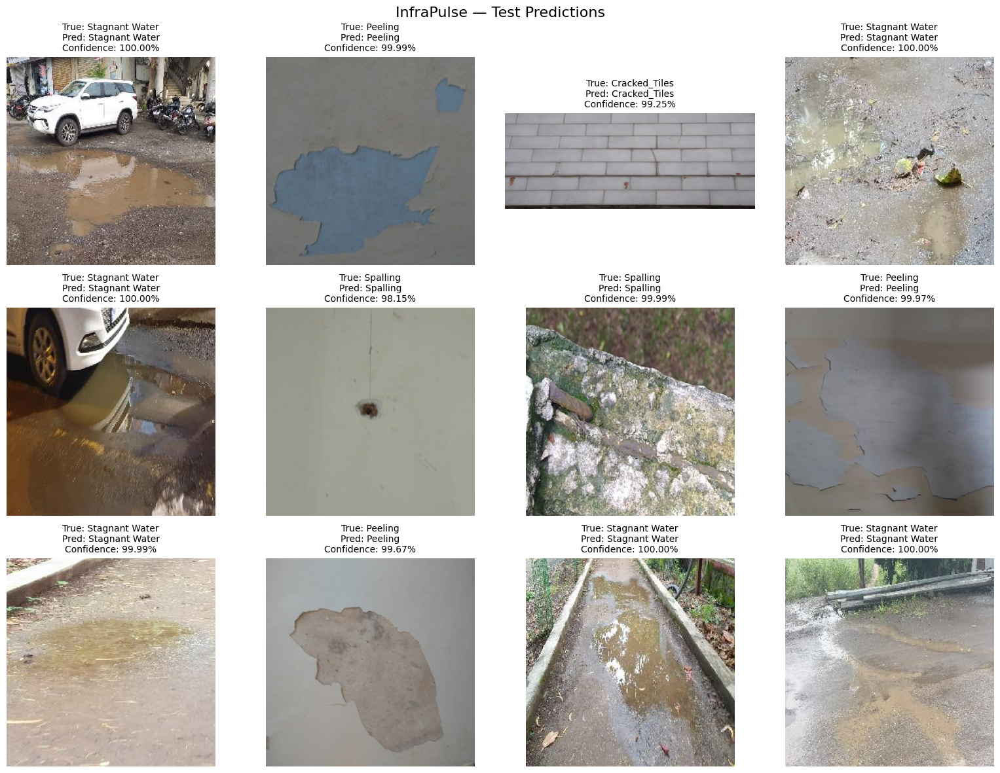

In [ ]:
# @title
# ============================================================
# INFRAPULSE — CELL 10
# VISUALIZE TEST PREDICTIONS
# ============================================================

import random
import matplotlib.pyplot as plt
from PIL import Image

# ------------------------------------------------------------
# 1. Random test samples
# ------------------------------------------------------------

NUM_SAMPLES = 12

random.seed(42)

sample_indices = random.sample(
    range(len(test_dataset)),
    min(NUM_SAMPLES, len(test_dataset))
)

# ------------------------------------------------------------
# 2. Visualization
# ------------------------------------------------------------

fig, axes = plt.subplots(
    3,
    4,
    figsize=(16, 12)
)

axes = axes.flatten()

for plot_idx, dataset_idx in enumerate(sample_indices):

    # Original path and true label
    image_path, true_label = test_dataset.samples[
        dataset_idx
    ]

    # Load original image for display
    original_image = Image.open(
        image_path
    ).convert("RGB")

    # Get transformed image
    image_tensor, _ = test_dataset[
        dataset_idx
    ]

    input_tensor = image_tensor.unsqueeze(
        0
    ).to(DEVICE)

    # Prediction
    with torch.no_grad():

        output = model(
            input_tensor
        )

        probability = torch.softmax(
            output,
            dim=1
        )

        predicted_label = torch.argmax(
            probability,
            dim=1
        ).item()

        confidence = probability[
            0,
            predicted_label
        ].item()

    # Display
    axes[plot_idx].imshow(
        original_image
    )

    true_name = CLASS_NAMES[
        true_label
    ]

    pred_name = CLASS_NAMES[
        predicted_label
    ]

    title = (
        f"True: {true_name}\n"
        f"Pred: {pred_name}\n"
        f"Confidence: {confidence:.2%}"
    )

    axes[plot_idx].set_title(
        title,
        fontsize=10
    )

    axes[plot_idx].axis("off")

plt.suptitle(
    "InfraPulse — Test Predictions",
    fontsize=16
)

plt.tight_layout()
plt.show()

In [ ]:
# @title
# ============================================================
# INFRAPULSE — CELL 11
# FAST MODEL BENCHMARK FRAMEWORK
# ============================================================

import os
import time
import copy
import torch
import torch.nn as nn
import numpy as np

from torchvision import models
from sklearn.metrics import (
    accuracy_score,
    f1_score
)

# ------------------------------------------------------------
# 1. Benchmark configuration
# ------------------------------------------------------------

BENCHMARK_EPOCHS = 12

BENCHMARK_DIR = "/content/all_files/models/benchmark"
os.makedirs(BENCHMARK_DIR, exist_ok=True)

# ------------------------------------------------------------
# 2. Model factory
# ------------------------------------------------------------

def create_model(model_name, num_classes):

    if model_name == "mobilenet_v3_small":

        model = models.mobilenet_v3_small(
            weights=models.MobileNet_V3_Small_Weights.DEFAULT
        )

        in_features = model.classifier[-1].in_features

        model.classifier[-1] = nn.Linear(
            in_features,
            num_classes
        )

    elif model_name == "efficientnet_b0":

        model = models.efficientnet_b0(
            weights=models.EfficientNet_B0_Weights.DEFAULT
        )

        in_features = model.classifier[-1].in_features

        model.classifier[-1] = nn.Linear(
            in_features,
            num_classes
        )

    elif model_name == "efficientnet_b1":

        model = models.efficientnet_b1(
            weights=models.EfficientNet_B1_Weights.DEFAULT
        )

        in_features = model.classifier[-1].in_features

        model.classifier[-1] = nn.Linear(
            in_features,
            num_classes
        )

    elif model_name == "resnet18":

        model = models.resnet18(
            weights=models.ResNet18_Weights.DEFAULT
        )

        in_features = model.fc.in_features

        model.fc = nn.Sequential(
            nn.Dropout(0.30),
            nn.Linear(
                in_features,
                num_classes
            )
        )

    else:
        raise ValueError(
            f"Unknown model: {model_name}"
        )

    return model.to(DEVICE)


# ------------------------------------------------------------
# 3. Single epoch training
# ------------------------------------------------------------

def train_one_epoch(
    model,
    loader,
    criterion,
    optimizer
):

    model.train()

    running_loss = 0.0

    predictions = []
    targets = []

    for images, labels in loader:

        images = images.to(
            DEVICE,
            non_blocking=True
        )

        labels = labels.to(
            DEVICE,
            non_blocking=True
        )

        optimizer.zero_grad(
            set_to_none=True
        )

        outputs = model(images)

        loss = criterion(
            outputs,
            labels
        )

        loss.backward()

        optimizer.step()

        running_loss += (
            loss.item()
            * images.size(0)
        )

        preds = outputs.argmax(
            dim=1
        )

        predictions.extend(
            preds.detach()
            .cpu()
            .numpy()
        )

        targets.extend(
            labels.detach()
            .cpu()
            .numpy()
        )

    loss = (
        running_loss
        / len(loader.dataset)
    )

    f1 = f1_score(
        targets,
        predictions,
        average="macro",
        zero_division=0
    )

    acc = accuracy_score(
        targets,
        predictions
    )

    return loss, acc, f1


# ------------------------------------------------------------
# 4. Validation
# ------------------------------------------------------------

def validate_model(
    model,
    loader,
    criterion
):

    model.eval()

    running_loss = 0.0

    predictions = []
    targets = []

    with torch.no_grad():

        for images, labels in loader:

            images = images.to(
                DEVICE,
                non_blocking=True
            )

            labels = labels.to(
                DEVICE,
                non_blocking=True
            )

            outputs = model(images)

            loss = criterion(
                outputs,
                labels
            )

            running_loss += (
                loss.item()
                * images.size(0)
            )

            preds = outputs.argmax(
                dim=1
            )

            predictions.extend(
                preds.cpu().numpy()
            )

            targets.extend(
                labels.cpu().numpy()
            )

    loss = (
        running_loss
        / len(loader.dataset)
    )

    f1 = f1_score(
        targets,
        predictions,
        average="macro",
        zero_division=0
    )

    acc = accuracy_score(
        targets,
        predictions
    )

    return loss, acc, f1


print("✅ Benchmark framework ready.")

✅ Benchmark framework ready.


In [ ]:
# @title
from google.colab import files

files.download('/content/all_files/models/infrapulse_resnet18_best.pth')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
# @title
# ============================================================
# INFRAPULSE — CELL 14
# COMPLETE MISCLASSIFICATION ANALYSIS
# ============================================================

import os
import numpy as np
import pandas as pd

from sklearn.metrics import confusion_matrix

# ------------------------------------------------------------
# 1. Confusion matrix
# ------------------------------------------------------------

cm = confusion_matrix(
    test_targets,
    test_preds,
    labels=list(range(NUM_CLASSES))
)

print("=" * 80)
print("COMPLETE TEST SET ERROR DISTRIBUTION")
print("=" * 80)

print("\nConfusion Matrix")
print("-" * 80)

cm_df = pd.DataFrame(
    cm,
    index=[
        f"TRUE: {c}"
        for c in CLASS_NAMES
    ],
    columns=[
        f"PRED: {c}"
        for c in CLASS_NAMES
    ]
)

display(cm_df)

# ------------------------------------------------------------
# 2. Total correct / incorrect
# ------------------------------------------------------------

total_test = len(test_targets)

total_correct = np.trace(cm)

total_wrong = total_test - total_correct

print("\n" + "=" * 80)
print("OVERALL")
print("=" * 80)

print(f"Total test images       : {total_test}")
print(f"Correctly classified    : {total_correct}")
print(f"Incorrectly classified  : {total_wrong}")
print(
    f"Test accuracy           : "
    f"{total_correct / total_test:.4%}"
)

# ------------------------------------------------------------
# 3. Errors by TRUE class
# ------------------------------------------------------------

print("\n" + "=" * 80)
print("ERRORS BY TRUE CLASS")
print("=" * 80)

error_summary = []

for i, class_name in enumerate(CLASS_NAMES):

    total_class = cm[i].sum()

    correct_class = cm[i, i]

    incorrect_class = (
        total_class - correct_class
    )

    error_rate = (
        incorrect_class / total_class
        if total_class > 0
        else 0
    )

    error_summary.append({
        "True Class": class_name,
        "Total Images": total_class,
        "Correct": correct_class,
        "Wrong": incorrect_class,
        "Error Rate": error_rate
    })

error_df = pd.DataFrame(
    error_summary
)

error_df["Error Rate"] = (
    error_df["Error Rate"] * 100
)

display(error_df)

# ------------------------------------------------------------
# 4. Detailed WRONG prediction distribution
# ------------------------------------------------------------

print("\n" + "=" * 80)
print("DETAILED WRONG-PREDICTION DISTRIBUTION")
print("=" * 80)

for true_idx, true_class in enumerate(CLASS_NAMES):

    print(
        f"\nTRUE CLASS: {true_class}"
    )

    print("-" * 60)

    wrong_found = False

    for pred_idx, pred_class in enumerate(CLASS_NAMES):

        if true_idx == pred_idx:
            continue

        count = cm[
            true_idx,
            pred_idx
        ]

        if count > 0:

            wrong_found = True

            percentage = (
                count / cm[true_idx].sum()
            ) * 100

            print(
                f"  → Predicted as "
                f"{pred_class:<20}: "
                f"{count:>3} images "
                f"({percentage:.2f}%)"
            )

    if not wrong_found:

        print(
            "  No misclassifications."
        )

# ------------------------------------------------------------
# 5. Every misclassified image
# ------------------------------------------------------------

print("\n" + "=" * 80)
print("BUILDING MISCLASSIFIED IMAGE TABLE")
print("=" * 80)

misclassified_records = []

for idx in range(
    len(test_dataset.samples)
):

    image_path, true_label = (
        test_dataset.samples[idx]
    )

    predicted_label = test_preds[idx]

    confidence = np.max(
        test_probabilities[idx]
    )

    if predicted_label != true_label:

        misclassified_records.append({

            "Index": idx,

            "Filename": os.path.basename(
                image_path
            ),

            "Image Path": image_path,

            "True Class": CLASS_NAMES[
                true_label
            ],

            "Predicted Class": CLASS_NAMES[
                predicted_label
            ],

            "Confidence": confidence

        })

misclassified_df = pd.DataFrame(
    misclassified_records
)

# ------------------------------------------------------------
# 6. Display misclassified images
# ------------------------------------------------------------

print(
    f"\nTotal misclassified images: "
    f"{len(misclassified_df)}"
)

if len(misclassified_df) > 0:

    display(
        misclassified_df
        .sort_values(
            "Confidence",
            ascending=False
        )
        .reset_index(drop=True)
    )

else:

    print(
        "🎉 No misclassified test images!"
    )

# ------------------------------------------------------------
# 7. Save error report
# ------------------------------------------------------------

ERROR_REPORT_PATH = (
    "/content/all_files/"
    "infrapulse_misclassification_report.csv"
)

misclassified_df.to_csv(
    ERROR_REPORT_PATH,
    index=False
)

print(
    f"\n✅ Error report saved to:\n"
    f"{ERROR_REPORT_PATH}"
)

COMPLETE TEST SET ERROR DISTRIBUTION

Confusion Matrix
--------------------------------------------------------------------------------


,PRED: Cracked_Tiles,PRED: Peeling,PRED: Spalling,PRED: Stagnant Water
TRUE: Cracked_Tiles,20,0,0,1
TRUE: Peeling,0,61,2,0
TRUE: Spalling,0,2,49,1
TRUE: Stagnant Water,2,0,0,297



OVERALL
Total test images       : 435
Correctly classified    : 427
Incorrectly classified  : 8
Test accuracy           : 98.1609%

ERRORS BY TRUE CLASS


,True Class,Total Images,Correct,Wrong,Error Rate
0,Cracked_Tiles,21,20,1,4.761905
1,Peeling,63,61,2,3.174603
2,Spalling,52,49,3,5.769231
3,Stagnant Water,299,297,2,0.668896



DETAILED WRONG-PREDICTION DISTRIBUTION

TRUE CLASS: Cracked_Tiles
------------------------------------------------------------
  → Predicted as Stagnant Water      :   1 images (4.76%)

TRUE CLASS: Peeling
------------------------------------------------------------
  → Predicted as Spalling            :   2 images (3.17%)

TRUE CLASS: Spalling
------------------------------------------------------------
  → Predicted as Peeling             :   2 images (3.85%)
  → Predicted as Stagnant Water      :   1 images (1.92%)

TRUE CLASS: Stagnant Water
------------------------------------------------------------
  → Predicted as Cracked_Tiles       :   2 images (0.67%)

BUILDING MISCLASSIFIED IMAGE TABLE

Total misclassified images: 8


,Index,Filename,Image Path,True Class,Predicted Class,Confidence
0,133,Spalling (89).jpg,/content/all_files/InfraPulse_Split/test/Spall...,Spalling,Peeling,0.994285
1,50,Peeling (258).jpg,/content/all_files/InfraPulse_Split/test/Peeli...,Peeling,Spalling,0.983344
2,1,008.png,/content/all_files/InfraPulse_Split/test/Crack...,Cracked_Tiles,Stagnant Water,0.978588
3,145,image1052.jpeg,/content/all_files/InfraPulse_Split/test/Stagn...,Stagnant Water,Cracked_Tiles,0.959023
4,129,Spalling (61).jpg,/content/all_files/InfraPulse_Split/test/Spall...,Spalling,Peeling,0.952561
5,79,Peeling (82).jpg,/content/all_files/InfraPulse_Split/test/Peeli...,Peeling,Spalling,0.945043
6,92,Spalling (141).jpg,/content/all_files/InfraPulse_Split/test/Spall...,Spalling,Stagnant Water,0.914618
7,311,image299.jpeg,/content/all_files/InfraPulse_Split/test/Stagn...,Stagnant Water,Cracked_Tiles,0.674881



✅ Error report saved to:
/content/all_files/infrapulse_misclassification_report.csv


In [ ]:
# @title
# ============================================================
# INFRAPULSE — CELL 15
# SINGLE IMAGE INFERENCE
# ============================================================

import torch
import torch.nn as nn

from PIL import Image
from torchvision import models, transforms

# ------------------------------------------------------------
# 1. Model path
# ------------------------------------------------------------

MODEL_PATH = (
    "/content/all_files/models/"
    "infrapulse_resnet18_best.pth"
)

# ------------------------------------------------------------
# 2. Device
# ------------------------------------------------------------

DEVICE = torch.device(
    "cuda" if torch.cuda.is_available()
    else "cpu"
)

# ------------------------------------------------------------
# 3. Class names
# ------------------------------------------------------------

CLASS_NAMES = [
    "Cracked_Tiles",
    "Peeling",
    "Spalling",
    "Stagnant_Water"
]

NUM_CLASSES = len(CLASS_NAMES)

# ------------------------------------------------------------
# 4. Recreate ResNet18 architecture
# ------------------------------------------------------------

model = models.resnet18(
    weights=None
)

num_features = model.fc.in_features

model.fc = nn.Sequential(
    nn.Dropout(0.30),
    nn.Linear(
        num_features,
        NUM_CLASSES
    )
)

# ------------------------------------------------------------
# 5. Load trained weights
# ------------------------------------------------------------

checkpoint = torch.load(
    MODEL_PATH,
    map_location=DEVICE
)

model.load_state_dict(
    checkpoint["model_state_dict"]
)

model = model.to(DEVICE)

model.eval()

print("✅ Trained InfraPulse model loaded.")
print(
    f"Best validation Macro-F1: "
    f"{checkpoint['val_f1']:.4f}"
)

# ------------------------------------------------------------
# 6. Inference transformation
# ------------------------------------------------------------

inference_transform = transforms.Compose([

    transforms.Resize(
        (224, 224)
    ),

    transforms.ToTensor(),

    transforms.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225]
    )
])

# ------------------------------------------------------------
# 7. Function for prediction
# ------------------------------------------------------------

def predict_image(
    image_path,
    model=model
):

    # Load image
    image = Image.open(
        image_path
    ).convert("RGB")

    # Transform
    tensor = inference_transform(
        image
    )

    tensor = tensor.unsqueeze(
        0
    ).to(DEVICE)

    # Inference
    with torch.no_grad():

        output = model(
            tensor
        )

        probabilities = torch.softmax(
            output,
            dim=1
        )

        predicted_idx = torch.argmax(
            probabilities,
            dim=1
        ).item()

    # Results
    predicted_class = CLASS_NAMES[
        predicted_idx
    ]

    confidence = probabilities[
        0,
        predicted_idx
    ].item()

    # All probabilities
    class_probabilities = {
        CLASS_NAMES[i]: float(
            probabilities[0, i]
        )
        for i in range(NUM_CLASSES)
    }

    return {
        "predicted_class": predicted_class,
        "confidence": confidence,
        "probabilities": class_probabilities
    }

print("\n✅ Inference function ready.")

✅ Trained InfraPulse model loaded.
Best validation Macro-F1: 0.9657

✅ Inference function ready.


Saving efb2f8dd-3b7c-4d87-9135-8b1e4d2e9ba5.jpg to efb2f8dd-3b7c-4d87-9135-8b1e4d2e9ba5.jpg

INFRAPULSE PREDICTION

Image: efb2f8dd-3b7c-4d87-9135-8b1e4d2e9ba5.jpg


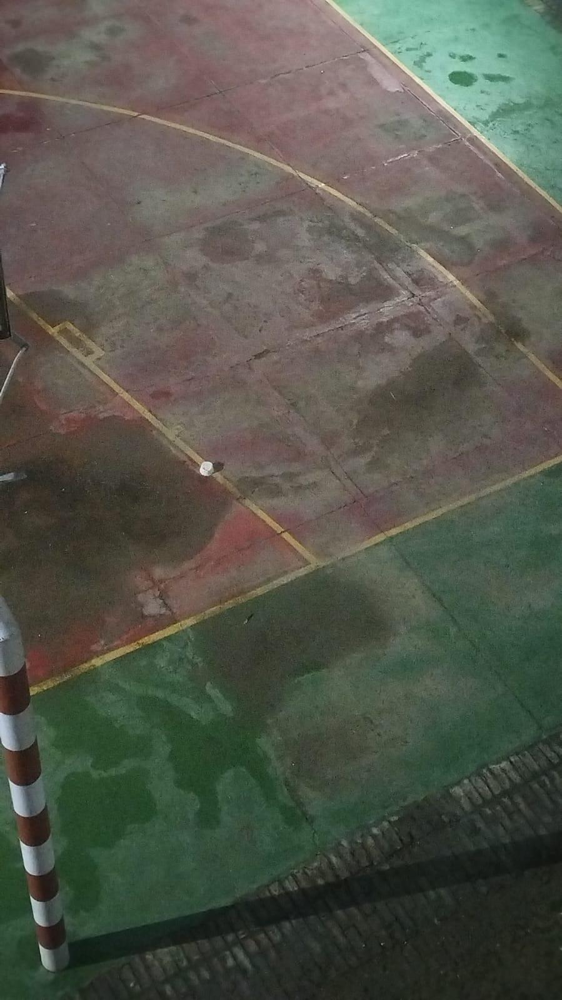


Predicted defect : Cracked_Tiles
Confidence       : 98.95%

Class probabilities:
  Cracked_Tiles       98.95%
  Stagnant_Water      0.92%
  Spalling            0.11%
  Peeling             0.02%


In [ ]:
# @title
# ============================================================
# INFRAPULSE — CELL 16
# UPLOAD + CLASSIFY NEW IMAGE
# ============================================================

from google.colab import files
from IPython.display import display
from PIL import Image

# ------------------------------------------------------------
# Upload
# ------------------------------------------------------------

uploaded = files.upload()

# ------------------------------------------------------------
# Process uploaded files
# ------------------------------------------------------------

for filename in uploaded.keys():

    print("\n" + "=" * 70)
    print("INFRAPULSE PREDICTION")
    print("=" * 70)

    print(f"\nImage: {filename}")

    # Display image
    image = Image.open(
        filename
    ).convert("RGB")

    display(image)

    # Prediction
    result = predict_image(
        filename
    )

    print(
        f"\nPredicted defect : "
        f"{result['predicted_class']}"
    )

    print(
        f"Confidence       : "
        f"{result['confidence']:.2%}"
    )

    print("\nClass probabilities:")

    for class_name, probability in sorted(
        result["probabilities"].items(),
        key=lambda x: x[1],
        reverse=True
    ):

        print(
            f"  {class_name:<20}"
            f"{probability:.2%}"
        )

TESTING

In [ ]:
# @title
# ============================================================
# INFRAPULSE — REAL-TIME INFERENCE
# CELL 1: LOAD TRAINED MOBILENETV3-SMALL
# ============================================================

import os
import torch
import torch.nn as nn

from torchvision import models, transforms
from PIL import Image

# ------------------------------------------------------------
# 1. Configuration
# ------------------------------------------------------------

MODEL_PATH = "/content/mobilenet_v3_small_best.pth"

CLASS_NAMES = [
    "Cracked_Tiles",
    "Peeling",
    "Spalling",
    "Stagnant_Water"
]

NUM_CLASSES = len(CLASS_NAMES)

DEVICE = torch.device(
    "cuda" if torch.cuda.is_available() else "cpu"
)

print("=" * 70)
print("INFRAPULSE MODEL LOADING")
print("=" * 70)

print(f"\nModel path : {MODEL_PATH}")
print(f"Device     : {DEVICE}")

if not os.path.exists(MODEL_PATH):
    raise FileNotFoundError(
        f"Model not found at: {MODEL_PATH}"
    )

# ------------------------------------------------------------
# 2. Recreate EXACT MobileNetV3-Small architecture
# ------------------------------------------------------------

model = models.mobilenet_v3_small(
    weights=None
)

# The original training code replaced the final
# classifier layer with a 4-class output layer.

in_features = model.classifier[-1].in_features

model.classifier[-1] = nn.Linear(
    in_features,
    NUM_CLASSES
)

# ------------------------------------------------------------
# 3. Load checkpoint
# ------------------------------------------------------------

checkpoint = torch.load(
    MODEL_PATH,
    map_location=DEVICE
)

print("\nCheckpoint type:", type(checkpoint))

# Your benchmark code saved a dictionary containing:
#
# model_name
# model_state_dict
# best_val_f1
# best_epoch
# class_names

if isinstance(checkpoint, dict) and "model_state_dict" in checkpoint:

    model.load_state_dict(
        checkpoint["model_state_dict"]
    )

    print(
        f"Best validation Macro-F1: "
        f"{checkpoint.get('best_val_f1', 'N/A')}"
    )

    print(
        f"Best epoch: "
        f"{checkpoint.get('best_epoch', 'N/A')}"
    )

else:

    # Fallback in case the file contains only state_dict
    model.load_state_dict(
        checkpoint
    )

# ------------------------------------------------------------
# 4. Move to device
# ------------------------------------------------------------

model = model.to(DEVICE)

model.eval()

# ------------------------------------------------------------
# 5. Confirmation
# ------------------------------------------------------------

print("\n" + "=" * 70)
print("✅ MODEL LOADED SUCCESSFULLY")
print("=" * 70)

print("\nClasses:")

for i, class_name in enumerate(CLASS_NAMES):
    print(f"  {i} → {class_name}")








# @title
# ============================================================
# INFRAPULSE — REAL-TIME INFERENCE
# CELL 2: PREPROCESSING
# ============================================================

inference_transform = transforms.Compose([

    transforms.Resize(
        (224, 224)
    ),

    transforms.ToTensor(),

    transforms.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225]
    )
])

print("✅ Inference preprocessing ready.")










# @title
# ============================================================
# INFRAPULSE — REAL-TIME INFERENCE
# CELL 3: PREDICTION FUNCTION
# ============================================================

def predict_image(image_path):

    # --------------------------------------------------------
    # Load image
    # --------------------------------------------------------

    image = Image.open(
        image_path
    ).convert("RGB")

    # --------------------------------------------------------
    # Preprocess
    # --------------------------------------------------------

    tensor = inference_transform(
        image
    )

    # Add batch dimension
    tensor = tensor.unsqueeze(0)

    # Move to GPU/CPU
    tensor = tensor.to(DEVICE)

    # --------------------------------------------------------
    # Inference
    # --------------------------------------------------------

    with torch.no_grad():

        outputs = model(
            tensor
        )

        probabilities = torch.softmax(
            outputs,
            dim=1
        )

        predicted_index = torch.argmax(
            probabilities,
            dim=1
        ).item()

    # --------------------------------------------------------
    # Extract results
    # --------------------------------------------------------

    predicted_class = CLASS_NAMES[
        predicted_index
    ]

    confidence = probabilities[
        0,
        predicted_index
    ].item()

    all_probabilities = {
        CLASS_NAMES[i]: float(
            probabilities[0, i]
        )
        for i in range(NUM_CLASSES)
    }

    return {
        "class": predicted_class,
        "confidence": confidence,
        "probabilities": all_probabilities
    }


print("✅ Prediction function ready.")

INFRAPULSE MODEL LOADING

Model path : /content/mobilenet_v3_small_best.pth
Device     : cpu

Checkpoint type: <class 'dict'>
Best validation Macro-F1: 0.9726022185519674
Best epoch: 9

✅ MODEL LOADED SUCCESSFULLY

Classes:
  0 → Cracked_Tiles
  1 → Peeling
  2 → Spalling
  3 → Stagnant_Water
✅ Inference preprocessing ready.
✅ Prediction function ready.


UPLOAD REAL TIME TO CHECK

Saving a9ee5885-03bf-4512-a4d0-d628a5207fa1.jpg to a9ee5885-03bf-4512-a4d0-d628a5207fa1.jpg

INFRAPULSE DEFECT DETECTION

Image: a9ee5885-03bf-4512-a4d0-d628a5207fa1.jpg


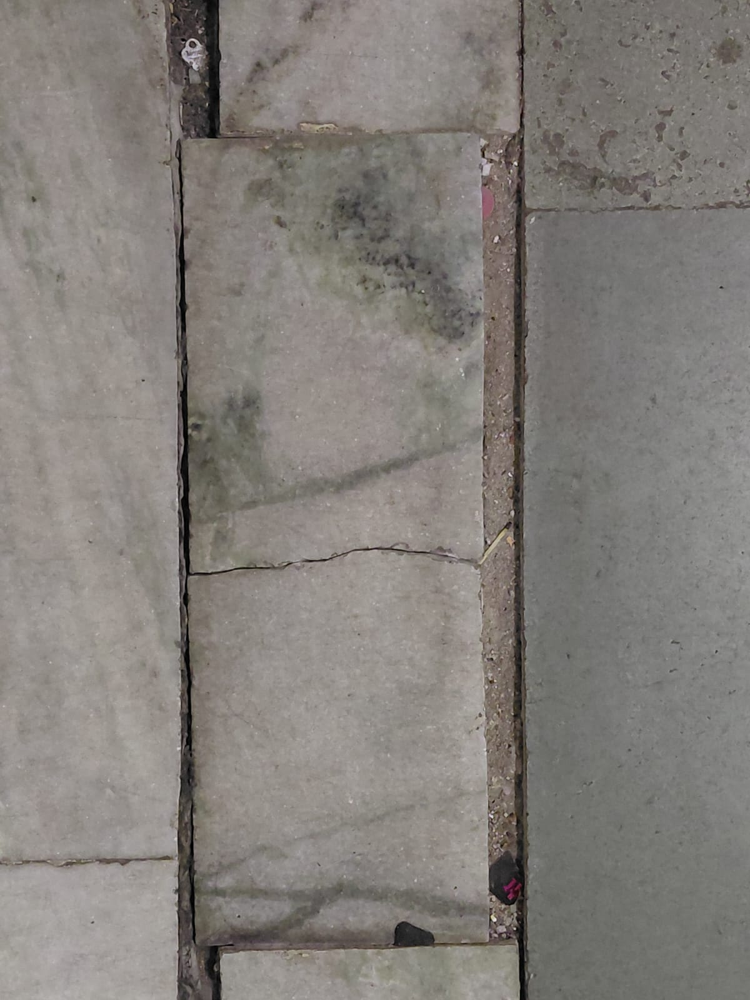


----------------------------------------------------------------------
DEFECT: Cracked_Tiles
CONFIDENCE: 98.42%

Class probabilities:
  Cracked_Tiles         98.42%
  Spalling               1.10%
  Stagnant_Water         0.42%
  Peeling                0.05%
----------------------------------------------------------------------


In [ ]:
# @title
# ============================================================
# INFRAPULSE — REAL-TIME INFERENCE
# CELL 4: UPLOAD + CLASSIFY
# ============================================================

from google.colab import files
from IPython.display import display

# ------------------------------------------------------------
# Upload image
# ------------------------------------------------------------

uploaded = files.upload()

# ------------------------------------------------------------
# Classify each uploaded image
# ------------------------------------------------------------

for filename in uploaded.keys():

    print("\n" + "=" * 70)
    print("INFRAPULSE DEFECT DETECTION")
    print("=" * 70)

    print(f"\nImage: {filename}")

    # Display image
    image = Image.open(
        filename
    ).convert("RGB")

    display(image)

    # --------------------------------------------------------
    # Prediction
    # --------------------------------------------------------

    result = predict_image(
        filename
    )

    # --------------------------------------------------------
    # Main result
    # --------------------------------------------------------

    print("\n" + "-" * 70)

    print(
        f"DEFECT: "
        f"{result['class']}"
    )

    print(
        f"CONFIDENCE: "
        f"{result['confidence']:.2%}"
    )

    # --------------------------------------------------------
    # All probabilities
    # --------------------------------------------------------

    print("\nClass probabilities:")

    sorted_probs = sorted(
        result["probabilities"].items(),
        key=lambda x: x[1],
        reverse=True
    )

    for class_name, probability in sorted_probs:

        print(
            f"  {class_name:<20} "
            f"{probability:>7.2%}"
        )

    print("-" * 70)

SEVERITY RANKING AND PRIORITY LEADERBOARD

In [ ]:
# @title
# ============================================================
# INFRAPULSE — DECISION ENGINE
# CELL 5: DEFECT → DEPARTMENT → SEVERITY → PRIORITY
# ============================================================

# ------------------------------------------------------------
# 1. Department mapping
# ------------------------------------------------------------

DEFECT_DEPARTMENT = {

    "Cracked_Tiles": "Performance",

    "Peeling": "Performance",

    "Spalling": "Structural",

    "Stagnant_Water": "Functional"
}


# ------------------------------------------------------------
# 2. Base priority for each defect
# ------------------------------------------------------------
#
# Higher = more urgent.
#
# These are transparent engineering rules for the prototype.
# They can later be calibrated using real facility data.
# ------------------------------------------------------------

DEFECT_BASE_PRIORITY = {

    "Cracked_Tiles": 75,

    "Spalling": 85,

    "Stagnant_Water": 60,

    "Peeling": 40
}


# ------------------------------------------------------------
# 3. Severity thresholds
# ------------------------------------------------------------

def severity_from_score(score):

    if score >= 75:
        return "HIGH"

    elif score >= 45:
        return "MEDIUM"

    else:
        return "LOW"


# ------------------------------------------------------------
# 4. Calculate severity + priority
# ------------------------------------------------------------

def calculate_priority(
    defect_class,
    confidence
):

    base_priority = DEFECT_BASE_PRIORITY[
        defect_class
    ]

    # Confidence contribution
    confidence_component = (
        confidence * 10
    )

    raw_priority = (
        base_priority
        + confidence_component
    )

    # Clamp to 0–100
    priority_score = min(
        100,
        max(
            0,
            raw_priority
        )
    )

    severity = severity_from_score(
        priority_score
    )

    department = DEFECT_DEPARTMENT[
        defect_class
    ]

    return {
        "department": department,
        "severity": severity,
        "priority_score": priority_score
    }


print("✅ InfraPulse decision engine ready.")

✅ InfraPulse decision engine ready.


Saving 2b31ea2f-6040-4cd6-b4b2-538318ae0e96.jpg to 2b31ea2f-6040-4cd6-b4b2-538318ae0e96.jpg


                 INFRAPULSE ISSUE ANALYSIS


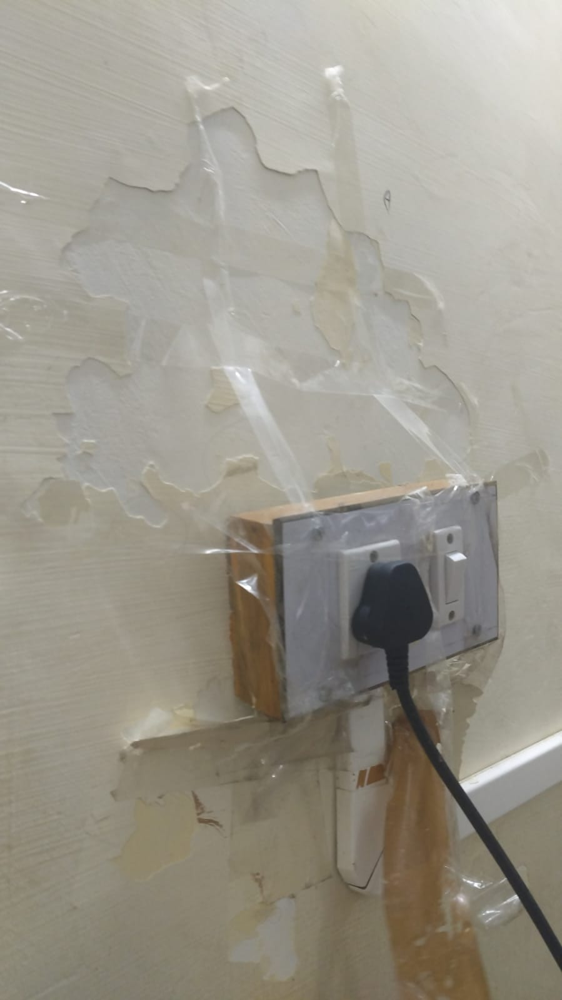


---------------------------------------------------------------------------
DEFECT                   : Peeling
DEPARTMENT               : Performance
SEVERITY                 : MEDIUM
PRIORITY SCORE           : 47.2 / 100
MODEL CONFIDENCE         : 71.52%
INFERENCE TIME           : 58.79 ms
---------------------------------------------------------------------------

Class probabilities:
  Peeling             71.52%
  Stagnant_Water      23.66%
  Spalling            4.07%
  Cracked_Tiles       0.75%


In [ ]:
# @title
# ============================================================
# INFRAPULSE — REAL-TIME INFERENCE
# CELL 6: COMPLETE ISSUE ANALYSIS
# ============================================================

from google.colab import files
from IPython.display import display
from PIL import Image
import time


# ------------------------------------------------------------
# Upload
# ------------------------------------------------------------

uploaded = files.upload()


# ------------------------------------------------------------
# Process every uploaded image
# ------------------------------------------------------------

for filename in uploaded.keys():

    print("\n")
    print("=" * 75)
    print("                 INFRAPULSE ISSUE ANALYSIS")
    print("=" * 75)

    # --------------------------------------------------------
    # Load image
    # --------------------------------------------------------

    image = Image.open(
        filename
    ).convert("RGB")

    display(image)

    # --------------------------------------------------------
    # Start inference timer
    # --------------------------------------------------------

    start_time = time.perf_counter()

    # --------------------------------------------------------
    # ML prediction
    # --------------------------------------------------------

    result = predict_image(
        filename
    )

    # --------------------------------------------------------
    # End timer
    # --------------------------------------------------------

    inference_time = (
        time.perf_counter()
        - start_time
    )

    # --------------------------------------------------------
    # Decision engine
    # --------------------------------------------------------

    decision = calculate_priority(

        defect_class=result["class"],

        confidence=result["confidence"]
    )

    # --------------------------------------------------------
    # Extract values
    # --------------------------------------------------------

    defect = result["class"]

    confidence = result["confidence"]

    department = decision["department"]

    severity = decision["severity"]

    priority = decision["priority_score"]

    # --------------------------------------------------------
    # Display result
    # --------------------------------------------------------

    print("\n" + "-" * 75)

    print(
        f"{'DEFECT':<25}: {defect}"
    )

    print(
        f"{'DEPARTMENT':<25}: {department}"
    )

    print(
        f"{'SEVERITY':<25}: {severity}"
    )

    print(
        f"{'PRIORITY SCORE':<25}: "
        f"{priority:.1f} / 100"
    )

    print(
        f"{'MODEL CONFIDENCE':<25}: "
        f"{confidence:.2%}"
    )

    print(
        f"{'INFERENCE TIME':<25}: "
        f"{inference_time * 1000:.2f} ms"
    )

    print("-" * 75)

    print("\nClass probabilities:")

    for class_name, probability in sorted(
        result["probabilities"].items(),
        key=lambda x: x[1],
        reverse=True
    ):

        print(
            f"  {class_name:<20}"
            f"{probability:.2%}"
        )

    print("=" * 75)

In [ ]:
# @title
# ============================================================
# INFRAPULSE — CELL 7
# ISSUE DATABASE + AUTOMATIC PRIORITY LEADERBOARD
# ============================================================

import os
import time
import pandas as pd
import numpy as np

from datetime import datetime
from google.colab import files
from IPython.display import display, HTML
from PIL import Image


# ============================================================
# 1. ISSUE DATABASE
# ============================================================

# Create the database if it doesn't already exist

if "issue_database" not in globals():

    issue_database = pd.DataFrame(
        columns=[
            "Issue ID",
            "Image",
            "Defect",
            "Department",
            "Confidence",
            "Severity",
            "Priority",
            "Inference Time (ms)",
            "Status",
            "Timestamp"
        ]
    )

# Persistent issue counter

if "issue_counter" not in globals():

    issue_counter = 0


# ============================================================
# 2. CREATE ISSUE ID
# ============================================================

def generate_issue_id():

    global issue_counter

    issue_counter += 1

    return f"IP-{issue_counter:04d}"


# ============================================================
# 3. PROCESS ONE IMAGE
# ============================================================

def process_infrapulse_image(
    image_path
):

    # --------------------------------------------------------
    # Start timer
    # --------------------------------------------------------

    start_time = time.perf_counter()

    # --------------------------------------------------------
    # Run trained classifier
    # --------------------------------------------------------

    result = predict_image(
        image_path
    )

    # --------------------------------------------------------
    # Stop timer
    # --------------------------------------------------------

    inference_time = (
        time.perf_counter()
        - start_time
    )

    inference_time_ms = (
        inference_time * 1000
    )

    # --------------------------------------------------------
    # Run InfraPulse decision engine
    # --------------------------------------------------------

    decision = calculate_priority(

        defect_class=result["class"],

        confidence=result["confidence"]
    )

    # --------------------------------------------------------
    # Generate issue ID
    # --------------------------------------------------------

    issue_id = generate_issue_id()

    # --------------------------------------------------------
    # Create issue record
    # --------------------------------------------------------

    issue = {

        "Issue ID":
            issue_id,

        "Image":
            os.path.basename(
                image_path
            ),

        "Defect":
            result["class"],

        "Department":
            decision["department"],

        "Confidence":
            result["confidence"],

        "Severity":
            decision["severity"],

        "Priority":
            decision["priority_score"],

        "Inference Time (ms)":
            inference_time_ms,

        "Status":
            "Submitted",

        "Timestamp":
            datetime.now().strftime(
                "%Y-%m-%d %H:%M:%S"
            )
    }

    return issue


# ============================================================
# 4. LEADERBOARD GENERATOR
# ============================================================

def get_leaderboard():

    if len(issue_database) == 0:

        return issue_database.copy()

    leaderboard = (
        issue_database
        .sort_values(
            by=[
                "Priority",
                "Confidence"
            ],
            ascending=[
                False,
                False
            ]
        )
        .reset_index(drop=True)
        .copy()
    )

    # Add ranking

    leaderboard.insert(
        0,
        "Rank",
        range(
            1,
            len(leaderboard) + 1
        )
    )

    return leaderboard


# ============================================================
# 5. DISPLAY LEADERBOARD
# ============================================================

def display_leaderboard():

    leaderboard = get_leaderboard()

    if len(leaderboard) == 0:

        print(
            "No issues in database yet."
        )

        return

    print("\n")
    print("=" * 110)
    print("                 INFRAPULSE — LIVE PRIORITY LEADERBOARD")
    print("=" * 110)

    print(
        f"\nTotal active issues: "
        f"{len(leaderboard)}"
    )

    print(
        f"Last updated: "
        f"{datetime.now().strftime('%Y-%m-%d %H:%M:%S')}"
    )

    print("\n")

    # --------------------------------------------------------
    # Display selected columns
    # --------------------------------------------------------

    display_df = leaderboard[
        [
            "Rank",
            "Issue ID",
            "Image",
            "Defect",
            "Department",
            "Confidence",
            "Severity",
            "Priority",
            "Inference Time (ms)",
            "Status"
        ]
    ].copy()

    # Format confidence

    display_df["Confidence"] = (
        display_df["Confidence"]
        .apply(
            lambda x: f"{x:.2%}"
        )
    )

    # Format priority

    display_df["Priority"] = (
        display_df["Priority"]
        .apply(
            lambda x: f"{x:.1f}"
        )
    )

    # Format inference time

    display_df["Inference Time (ms)"] = (
        display_df["Inference Time (ms)"]
        .apply(
            lambda x: f"{x:.2f}"
        )
    )

    display(
        display_df
        .style
        .set_properties(
            **{
                "text-align": "center"
            }
        )
    )


# ============================================================
# 6. UPLOAD MULTIPLE IMAGES
# ============================================================

print("=" * 110)
print("             INFRAPULSE — NEW ISSUE SUBMISSION")
print("=" * 110)

print(
    "\nSelect 1–20 building/defect images."
)

uploaded = files.upload()


# ============================================================
# 7. PROCESS UPLOADED IMAGES
# ============================================================

new_issues = []

for filename in uploaded.keys():

    print(
        f"\nProcessing: {filename}"
    )

    try:

        # ----------------------------------------------------
        # Validate image
        # ----------------------------------------------------

        image = Image.open(
            filename
        ).convert("RGB")

        # ----------------------------------------------------
        # Process image
        # ----------------------------------------------------

        issue = process_infrapulse_image(
            filename
        )

        # ----------------------------------------------------
        # Add to database
        # ----------------------------------------------------

        new_issues.append(
            issue
        )

        print(
            f"  ✓ {issue['Issue ID']}"
            f" | {issue['Defect']}"
            f" | {issue['Severity']}"
            f" | Priority {issue['Priority']:.1f}"
            f" | {issue['Inference Time (ms)']:.2f} ms"
        )

    except Exception as e:

        print(
            f"  ✗ Failed: {filename}"
        )

        print(
            f"    Error: {e}"
        )


# ============================================================
# 8. APPEND NEW ISSUES TO DATABASE
# ============================================================

if len(new_issues) > 0:

    new_df = pd.DataFrame(
        new_issues
    )

    issue_database = pd.concat(
        [
            issue_database,
            new_df
        ],
        ignore_index=True
    )


# ============================================================
# 9. DISPLAY UPDATED LEADERBOARD
# ============================================================

display_leaderboard()


# ============================================================
# 10. DATABASE SUMMARY
# ============================================================

print("\n")
print("=" * 110)
print("                         DATABASE SUMMARY")
print("=" * 110)

print(
    f"\nTotal issues: "
    f"{len(issue_database)}"
)

if len(issue_database) > 0:

    print("\nIssues by department:")

    print(
        issue_database[
            "Department"
        ]
        .value_counts()
        .to_string()
    )

    print("\nIssues by severity:")

    print(
        issue_database[
            "Severity"
        ]
        .value_counts()
        .to_string()
    )

    print("\nIssues by defect:")

    print(
        issue_database[
            "Defect"
        ]
        .value_counts()
        .to_string()
    )

print("\n✅ InfraPulse issue database updated.")

             INFRAPULSE — NEW ISSUE SUBMISSION

Select 1–20 building/defect images.


Saving 2aef3734-98ee-42ce-a661-f8f1d394aae7.jpg to 2aef3734-98ee-42ce-a661-f8f1d394aae7.jpg

Processing: 2aef3734-98ee-42ce-a661-f8f1d394aae7.jpg
  ✓ IP-0003 | Spalling | HIGH | Priority 95.0 | 77.25 ms


                 INFRAPULSE — LIVE PRIORITY LEADERBOARD

Total active issues: 3
Last updated: 2026-08-30 21:50:34




,Rank,Issue ID,Image,Defect,Department,Confidence,Severity,Priority,Inference Time (ms),Status
0,1,IP-0003,2aef3734-98ee-42ce-a661-f8f1d394aae7.jpg,Spalling,Structural,99.58%,HIGH,95.0,77.25,Submitted
1,2,IP-0002,a9ee5885-03bf-4512-a4d0-d628a5207fa1 (1).jpg,Cracked_Tiles,Performance,98.42%,HIGH,84.8,55.31,Submitted
2,3,IP-0001,39c8a973-46b2-4a12-a459-915d286dc0e3.jpg,Stagnant_Water,Functional,85.34%,MEDIUM,68.5,46.04,Submitted




                         DATABASE SUMMARY

Total issues: 3

Issues by department:
Department
Functional     1
Performance    1
Structural     1

Issues by severity:
Severity
HIGH      2
MEDIUM    1

Issues by defect:
Defect
Stagnant_Water    1
Cracked_Tiles     1
Spalling          1

✅ InfraPulse issue database updated.


In [ ]:
# @title
# ============================================================
# INFRAPULSE — CELL 8
# VISUAL EXTENT + APPARENT SEVERITY ENGINE
# ============================================================

import cv2
import numpy as np
import torch
import torch.nn.functional as F
import matplotlib.pyplot as plt

from PIL import Image
from torchvision import transforms


# ============================================================
# 1. INFERENCE TRANSFORM
# ============================================================

extent_transform = transforms.Compose([

    transforms.Resize(
        (224, 224)
    ),

    transforms.ToTensor(),

    transforms.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225]
    )
])


# ============================================================
# 2. FIND LAST CONVOLUTIONAL LAYER
# ============================================================

# MobileNetV3-Small feature extractor:
#
# model.features
#       ↓
# convolutional blocks
#
# We use the final convolutional feature map
# for Grad-CAM.

target_layer = model.features[-1]


# ============================================================
# 3. GRAD-CAM STORAGE
# ============================================================

gradcam_activations = None
gradcam_gradients = None


def forward_hook(module, input, output):

    global gradcam_activations

    gradcam_activations = output


def backward_hook(module, grad_input, grad_output):

    global gradcam_gradients

    gradcam_gradients = grad_output[0]


# Register hooks
forward_handle = target_layer.register_forward_hook(
    forward_hook
)

backward_handle = target_layer.register_full_backward_hook(
    backward_hook
)


# ============================================================
# 4. GENERATE GRAD-CAM
# ============================================================

def generate_gradcam(image_path):

    global gradcam_activations
    global gradcam_gradients

    # Reset
    gradcam_activations = None
    gradcam_gradients = None

    # --------------------------------------------------------
    # Load image
    # --------------------------------------------------------

    original_image = Image.open(
        image_path
    ).convert("RGB")

    # --------------------------------------------------------
    # Transform
    # --------------------------------------------------------

    tensor = extent_transform(
        original_image
    )

    tensor = tensor.unsqueeze(
        0
    ).to(DEVICE)

    # --------------------------------------------------------
    # Forward + backward
    # --------------------------------------------------------

    model.zero_grad(
        set_to_none=True
    )

    output = model(
        tensor
    )

    predicted_index = torch.argmax(
        output,
        dim=1
    ).item()

    target_score = output[
        0,
        predicted_index
    ]

    target_score.backward()

    # --------------------------------------------------------
    # Extract activation + gradient
    # --------------------------------------------------------

    activations = (
        gradcam_activations
        .detach()
        .cpu()
    )

    gradients = (
        gradcam_gradients
        .detach()
        .cpu()
    )

    # --------------------------------------------------------
    # Global-average-pool gradients
    # --------------------------------------------------------

    weights = gradients.mean(
        dim=(2, 3),
        keepdim=True
    )

    # --------------------------------------------------------
    # Weighted activation map
    # --------------------------------------------------------

    cam = (
        weights * activations
    ).sum(
        dim=1
    )

    cam = F.relu(
        cam
    )

    cam = cam[0].numpy()

    # --------------------------------------------------------
    # Normalize 0–1
    # --------------------------------------------------------

    cam -= cam.min()

    if cam.max() > 0:

        cam /= cam.max()

    # --------------------------------------------------------
    # Resize to original image
    # --------------------------------------------------------

    original_np = np.array(
        original_image
    )

    height, width = (
        original_np.shape[:2]
    )

    cam_resized = cv2.resize(
        cam,
        (width, height)
    )

    return (
        original_np,
        cam_resized,
        predicted_index
    )


# ============================================================
# 5. CALCULATE VISIBLE EXTENT
# ============================================================

def calculate_visible_extent(
    cam,
    threshold=0.40
):

    # Pixels with Grad-CAM activation above
    # the threshold are considered strongly
    # defect-relevant.

    active_region = (
        cam >= threshold
    )

    total_pixels = (
        active_region.shape[0]
        *
        active_region.shape[1]
    )

    active_pixels = (
        active_region.sum()
    )

    extent_ratio = (
        active_pixels
        /
        total_pixels
    )

    extent_percentage = (
        extent_ratio * 100
    )

    return (
        extent_ratio,
        extent_percentage,
        active_region
    )


# ============================================================
# 6. CONVERT EXTENT → EXTENT SCORE
# ============================================================

def extent_score_from_ratio(
    extent_ratio
):

    # --------------------------------------------------------
    # Apparent visible extent scale
    #
    # 0–10%   → small
    # 10–25%  → moderate
    # 25–45%  → large
    # >45%    → very large
    # --------------------------------------------------------

    if extent_ratio < 0.10:

        score = 20
        extent_label = "SMALL"

    elif extent_ratio < 0.25:

        score = 45
        extent_label = "MODERATE"

    elif extent_ratio < 0.45:

        score = 70
        extent_label = "LARGE"

    else:

        score = 90
        extent_label = "VERY LARGE"

    return (
        score,
        extent_label
    )


# ============================================================
# 7. DEFECT RISK WEIGHTS
# ============================================================

# This represents the relative urgency of the
# defect type itself.
#
# These are prototype engineering rules and can
# later be calibrated using real maintenance data.

DEFECT_RISK_SCORE = {

    "Spalling": 90,

    "Cracked_Tiles": 80,

    "Stagnant_Water": 65,

    "Peeling": 40
}


# ============================================================
# 8. CALCULATE APPARENT SEVERITY
# ============================================================

def calculate_apparent_severity(
    defect,
    extent_score
):

    defect_score = (
        DEFECT_RISK_SCORE[
            defect
        ]
    )

    # --------------------------------------------------------
    # Combine defect risk and visible extent
    #
    # 65% defect risk
    # 35% visible extent
    # --------------------------------------------------------

    severity_score = (
        0.65 * defect_score
        +
        0.35 * extent_score
    )

    # --------------------------------------------------------
    # Severity category
    # --------------------------------------------------------

    if severity_score >= 75:

        severity = "HIGH"

    elif severity_score >= 50:

        severity = "MEDIUM"

    else:

        severity = "LOW"

    return (
        severity_score,
        severity
    )


# ============================================================
# 9. COMPLETE VISUAL ANALYSIS
# ============================================================

def analyze_visual_severity(
    image_path,
    show_heatmap=True
):

    # --------------------------------------------------------
    # Generate Grad-CAM
    # --------------------------------------------------------

    (
        original_image,
        cam,
        predicted_index
    ) = generate_gradcam(
        image_path
    )

    defect = CLASS_NAMES[
        predicted_index
    ]

    # --------------------------------------------------------
    # Calculate visible extent
    # --------------------------------------------------------

    (
        extent_ratio,
        extent_percentage,
        active_region
    ) = calculate_visible_extent(
        cam
    )

    # --------------------------------------------------------
    # Convert to extent score
    # --------------------------------------------------------

    (
        extent_score,
        extent_label
    ) = extent_score_from_ratio(
        extent_ratio
    )

    # --------------------------------------------------------
    # Calculate severity
    # --------------------------------------------------------

    (
        severity_score,
        severity
    ) = calculate_apparent_severity(
        defect,
        extent_score
    )

    # --------------------------------------------------------
    # Display heatmap
    # --------------------------------------------------------

    if show_heatmap:

        plt.figure(
            figsize=(8, 6)
        )

        plt.imshow(
            original_image
        )

        plt.imshow(
            cam,
            alpha=0.45
        )

        plt.axis(
            "off"
        )

        plt.title(
            f"{defect} | "
            f"Visible Extent: "
            f"{extent_percentage:.1f}%"
        )

        plt.show()

    # --------------------------------------------------------
    # Return results
    # --------------------------------------------------------

    return {

        "defect": defect,

        "visible_extent_ratio":
            extent_ratio,

        "visible_extent_percentage":
            extent_percentage,

        "extent_score":
            extent_score,

        "extent_label":
            extent_label,

        "severity_score":
            severity_score,

        "severity":
            severity,

        "gradcam":
            cam
    }


print("=" * 75)
print("✅ VISUAL EXTENT + APPARENT SEVERITY ENGINE READY")
print("=" * 75)

✅ VISUAL EXTENT + APPARENT SEVERITY ENGINE READY
